In [2]:
!unzip "/content/drive/MyDrive/home.zip"

Archive:  /content/drive/MyDrive/home.zip
   creating: home/
   creating: home/home/
   creating: home/home/ACRNet/
   creating: home/home/ACRNet/.git/
  inflating: home/home/ACRNet/.git/config  
  inflating: home/home/ACRNet/.git/description  
  inflating: home/home/ACRNet/.git/HEAD  
   creating: home/home/ACRNet/.git/hooks/
  inflating: home/home/ACRNet/.git/hooks/applypatch-msg.sample  
  inflating: home/home/ACRNet/.git/hooks/commit-msg.sample  
  inflating: home/home/ACRNet/.git/hooks/fsmonitor-watchman.sample  
  inflating: home/home/ACRNet/.git/hooks/post-update.sample  
  inflating: home/home/ACRNet/.git/hooks/pre-applypatch.sample  
  inflating: home/home/ACRNet/.git/hooks/pre-commit.sample  
  inflating: home/home/ACRNet/.git/hooks/pre-merge-commit.sample  
  inflating: home/home/ACRNet/.git/hooks/pre-push.sample  
  inflating: home/home/ACRNet/.git/hooks/pre-rebase.sample  
  inflating: home/home/ACRNet/.git/hooks/pre-receive.sample  
  inflating: home/home/ACRNet/.git/hook

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
import scipy.io as sio
from scipy.io import savemat
import numpy as np
import math
import random
import time
import matplotlib.pyplot as plt
from itertools import cycle
import itertools as it
from pathlib import Path
import os


In [4]:
from datetime import datetime
import sys
import traceback

DEBUG = -1
INFO = 0
EMPH = 1
WARNING = 2
ERROR = 3
FATAL = 4

log_level = INFO
line_seg = ''.join(['*'] * 65)


class LoggerFatalError(SystemExit):
    pass


def _format(level, messages):
    timestr = datetime.strftime(datetime.now(), '%m.%d/%H:%M')
    father = traceback.extract_stack()[-4]
    func_info = f'{father[0].split("/")[-1]}:{str(father[1]).ljust(4, " ")}'
    m = ' '.join(map(str, messages))
    msg = f'{level} {timestr} {func_info}] {m}'
    return msg


_log_file = None
_log_buffer = []
_RED = '\033[0;31m'
_GREEN = '\033[1;32m'
_LIGHT_RED = '\033[1;31m'
_ORANGE = '\033[0;33m'
_YELLOW = '\033[1;33m'
_NC = '\033[0m'  # No Color


def set_file(fname):
    global _log_file
    global _log_buffer
    if _log_file is not None:
        warning("Change log file to %s" % fname)
        _log_file.close()
    _log_file = open(fname, 'w')
    if len(_log_buffer):
        for s in _log_buffer:
            _log_file.write(s)
        _log_file.flush()


def debug(*messages, file=None):
    if log_level > DEBUG:
        return
    msg = _format('D', messages)

    if file is None:
        sys.stdout.write(_YELLOW + msg + _NC + '\n')
        sys.stdout.flush()
    else:
        with open(file, 'a+') as f:
            print(msg, file=f)


def info(*messages, file=None):
    if log_level > INFO:
        return
    msg = _format('I', messages)
    if file is None:
        sys.stdout.write(msg + '\n')
        sys.stdout.flush()
    else:
        with open(file, 'a+') as f:
            print(msg, file=f)


def emph(*messages, file=None):
    if log_level > EMPH:
        return
    msg = _format('EM', messages)
    if file is None:
        sys.stdout.write(_GREEN + msg + _NC + '\n')
        sys.stdout.flush()
    else:
        with open(file, 'a+') as f:
            print(msg, file=f)


def warning(*messages, file=None):
    if log_level > WARNING:
        return
    msg = _format('W', messages)
    if file is None:
        sys.stderr.write(_ORANGE + msg + _NC + '\n')
        sys.stderr.flush()
    else:
        with open(file, 'a+') as f:
            print(msg, file=f)


def error(*messages, file=None):
    if log_level > ERROR:
        return
    msg = _format('E', messages)
    if file is None:
        sys.stderr.write(_RED + msg + _NC + '\n')
        sys.stderr.flush()
    else:
        with open(file, 'a+') as f:
            print(msg, file=f)


def fatal(*messages, file=None):
    if log_level > FATAL:
        return
    msg = _format('F', messages)
    if file is None:
        sys.stderr.write(_LIGHT_RED + msg + _NC + '\n')
        sys.stderr.flush()
    else:
        with open(file, 'a+') as f:
            print(msg, file=f)

    raise LoggerFatalError(-1)


In [5]:
noise='noisy_codeword'

In [6]:
torch.manual_seed(0)

In [7]:
from zmq import OUT_BATCH_SIZE
from torch import nn
from collections import OrderedDict

#from utils import logger


__all__ = ["acrnet"]


class ConvBN(nn.Sequential):
    def __init__(self, in_planes, out_planes, kernel_size, stride=1, groups=1):
        if not isinstance(kernel_size, int):
            padding = [(i - 1) // 2 for i in kernel_size]
        else:
            padding = (kernel_size - 1) // 2
        super(ConvBN, self).__init__(OrderedDict([
            ('conv', nn.Conv2d(in_channels=in_planes,
                               out_channels=out_planes,
                               kernel_size=kernel_size,
                               stride=stride,
                               padding=padding,
                               groups=groups,
                               bias=False)),
            ('bn', nn.BatchNorm2d(out_planes))
        ]))


class ACRDecoderBlock(nn.Module):
    r""" Inverted residual with extensible width and group conv
    """
    def __init__(self, expansion):
        super(ACRDecoderBlock, self).__init__()
        width = 8 * expansion
        self.conv1_bn = ConvBN(2, width, [1, 9])
        self.prelu1 = nn.PReLU(num_parameters=width, init=0.3)
        self.conv2_bn = ConvBN(width, width, 7, groups=4 * expansion)
        self.prelu2 = nn.PReLU(num_parameters=width, init=0.3)
        self.conv3_bn = ConvBN(width, 2, [9, 1])
        self.prelu3 = nn.PReLU(num_parameters=2, init=0.3)
        self.identity = nn.Identity()

    def forward(self, x):
        identity = self.identity(x)

        residual = self.prelu1(self.conv1_bn(x))
        residual = self.prelu2(self.conv2_bn(residual))
        residual = self.conv3_bn(residual)

        return self.prelu3(identity + residual)


class ACREncoderBlock(nn.Module):
    def __init__(self):
        super(ACREncoderBlock, self).__init__()
        self.conv_bn1 = ConvBN(2, 2, [1, 9])
        self.prelu1 = nn.PReLU(num_parameters=2, init=0.3)
        self.conv_bn2 = ConvBN(2, 2, [9, 1])
        self.prelu2 = nn.PReLU(num_parameters=2, init=0.3)
        self.identity = nn.Identity()

    def forward(self, x):
        identity = self.identity(x)

        residual = self.prelu1(self.conv_bn1(x))
        residual = self.conv_bn2(residual)

        return self.prelu2(identity + residual)


class ACRNet(nn.Module):
    def __init__(self,
                 in_channels=2,
                 reduction=4
                 , expansion=1):
        super(ACRNet, self).__init__()
        info(f"=> Model ACRNet with reduction={reduction}")
        total_size, w, h = 2048, 32, 32

        self.encoder_feature = nn.Sequential(OrderedDict([
            ("conv5x5_bn", ConvBN(in_channels, 2, 5)),
            ("prelu", nn.PReLU(num_parameters=2, init=0.3)),
            ("ACREncoderBlock1", ACREncoderBlock()),
            ("ACREncoderBlock2", ACREncoderBlock()),
        ]))
        self.encoder_fc = nn.Linear(total_size, total_size // reduction)
        #self.add_noise()
        self.batchnorm  = nn.BatchNorm1d(num_features=total_size // reduction)
        self.fully_connect_layer=nn.Linear(total_size // reduction,1024)
        self.sigmoid_sparse=nn.Sigmoid()
        self.fully_connect_layer_2=nn.Linear(1024,512)

        self.decoder_fc = nn.Linear(total_size // reduction, total_size)
        self.decoder_feature = nn.Sequential(OrderedDict([
            ("conv5x5_bn", ConvBN(2, in_channels, 5)),
            ("prelu", nn.PReLU(num_parameters=2, init=0.3)),
            ("ACRDecoderBlock1", ACRDecoderBlock(expansion=expansion)),
            ("ACRDecoderBlock2", ACRDecoderBlock(expansion=expansion)),
            ("sigmoid", nn.Sigmoid())
        ]))

        for m in self.modules():
            if isinstance(m, (nn.Conv2d, nn.Linear)):
                nn.init.xavier_uniform_(m.weight)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)


    def add_noise(self,x):
     noise = x+torch.randn_like(x)
     #noise = torch.clip(noise,0.,1.)
     return noise

    def forward(self, x):
        n, c, h, w = x.detach().size()

        out = self.encoder_feature(x)
        out = self.encoder_fc(out.view(n, -1))
        #out=out +torch.randn(out.size())
        #adding nosie to code word
        out_skip=self.add_noise(out)
        #batch normalization
        out=self.batchnorm(out_skip)
        #fully connect layer
        out=self.fully_connect_layer(out)
        # activation function
        out=self.sigmoid_sparse(out)
        out.to_sparse_csr()
        #fully connected layer
        out=self.fully_connect_layer_2(out)
        out=out-out_skip
        out = self.decoder_fc(out)
        out = self.decoder_feature(out.view(n, c, h, w))

        return out


def acrnet(reduction=4,expansion=1):
    r""" Create an ACRNet architecture.
    """
    model = ACRNet(reduction=reduction,expansion=expansion)
    return model


In [ ]:
class RefineNet(nn.Module):
    def __init__(self, img_channels=2):
        super(RefineNet, self).__init__()

        self.conv = nn.Sequential(nn.Conv2d(img_channels, 8, kernel_size=(3, 3), padding=(1,1)),
                                  nn.BatchNorm2d(8, eps=1e-03, momentum=0.99),
                                  nn.LeakyReLU(negative_slope=0.3),
                                  nn.Conv2d(8, 16, kernel_size=(3, 3), padding=(1,1)),
                                  nn.BatchNorm2d(16, eps=1e-03, momentum=0.99),
                                  nn.LeakyReLU(negative_slope=0.3),
                                  nn.Conv2d(16, 2, kernel_size=(3, 3), padding=(1,1)),
                                  nn.BatchNorm2d(2, eps=1e-03, momentum=0.99))

        self.leakyRelu = nn.LeakyReLU(negative_slope=0.3)

    def forward(self, x):
        ori_x = x.clone()

        # concatenate
        x = self.conv(x) + ori_x

        return self.leakyRelu(x)


class CsiNet(nn.Module):
    def __init__(self, img_height=32, img_width=32, img_channels=2, residual_num=2, encoded_dim=512):
        super(CsiNet, self).__init__()

        img_total = img_height * img_width * img_channels

        self.conv1 = nn.Sequential(nn.Conv2d(img_channels, 2, kernel_size=(3, 3), padding=(1,1)),
                                   nn.BatchNorm2d(2, eps=1e-03, momentum=0.99),
                                   nn.LeakyReLU(negative_slope=0.3))

        self.dense = nn.Sequential(nn.Linear(img_total, encoded_dim),
                                   nn.Tanh(),
                                   #nn.Sigmoid(),
                                   nn.Linear(encoded_dim, img_total))

        self.decoder = nn.ModuleList([RefineNet(img_channels)
                                      for _ in range(residual_num)])

        self.conv2 = nn.Sequential(nn.Conv2d(img_channels, 2, kernel_size=(3, 3), padding=(1,1)),
                                   nn.Sigmoid())

    def forward(self, x):
        batch_size, channels, height, width = x.size()

        # Encoder, convolution & reshape
        x = self.conv1(x)
        x = x.contiguous().view(batch_size, channels * height * width)

        # Dense & reshape
        x = self.dense(x)
        x = x.contiguous().view(batch_size, channels, height, width)

        # Residual decoders
        for layer in self.decoder:
            x = layer(x)

        # Final convolution
        x = self.conv2(x)

        # x = self.Encoder(x)
        # x = self.Decoder(x)

        return x

In [8]:
envir = 'outdoor'  # 'indoor' or 'outdoor'
# image params
img_height = 32
img_width = 32
img_channels = 2
img_total = img_height * img_width * img_channels
# network params
residual_num = 2
encoded_dim = 512  # compress rate=1/4->dim.=512, compress rate=1/16->dim.=128, compress rate=1/32->dim.=64, compress rate=1/64->dim.=32
# Data loading
if envir == 'indoor':
    mat = sio.loadmat('/content/home/home/cost2100/DATA_Htrainin.mat')
    x_train = mat['HT']  # array
    mat = sio.loadmat('/content/home/home/cost2100/DATA_Hvalin.mat')
    x_val = mat['HT']  # array
    mat = sio.loadmat('/content/home/home/cost2100/DATA_Htestin.mat')
    x_test = mat['HT']  # array
    mat = sio.loadmat('/content/home/home/cost2100/DATA_HtestFin_all.mat')
    X_test = mat['HF_all']  # array

elif envir == 'outdoor':
    mat = sio.loadmat('/content/home/home/cost2100/DATA_Htrainout.mat')
    x_train = mat['HT']  # array
    mat = sio.loadmat('/content/home/home/cost2100/DATA_Hvalout.mat')
    x_val = mat['HT']  # array
    mat = sio.loadmat('/content/home/home/cost2100/DATA_Htestout.mat')
    x_test = mat['HT']  # array
    mat = sio.loadmat('/content/home/home/cost2100/DATA_HtestFout_all.mat')
    X_test = mat['HF_all']  # array

In [9]:
x_train = x_train.astype('float32')
x_val = x_val.astype('float32')
x_test = x_test.astype('float32')
X_test = X_test.astype('float32')

<ipython-input-9-a92e17f4a55e>:4: ComplexWarning: Casting complex values to real discards the imaginary part
  X_test = X_test.astype('float32')


In [10]:
x_train_length = len(x_train)
print(len(x_train))
print(x_train.shape)
x_val_length = len(x_val)
print(len(x_val))
print(x_val.shape)
x_test_length = len(x_test)
print(len(x_test))
print(x_test.shape)
print(len(X_test))
print(X_test.shape)

100000
(100000, 2048)
30000
(30000, 2048)
20000
(20000, 2048)
20000
(20000, 4000)


In [11]:
x_train = np.reshape(x_train, (x_train_length, img_channels, img_height, img_width))  # adapt this if using `channels_first` image data format
x_val = np.reshape(x_val, (x_val_length, img_channels, img_height, img_width))  # adapt this if using `channels_first` image data format
x_test = np.reshape(x_test, (x_test_length, img_channels, img_height, img_width))  # adapt this if using `channels_first` image data format

In [12]:
x_train.shape

(100000, 2, 32, 32)

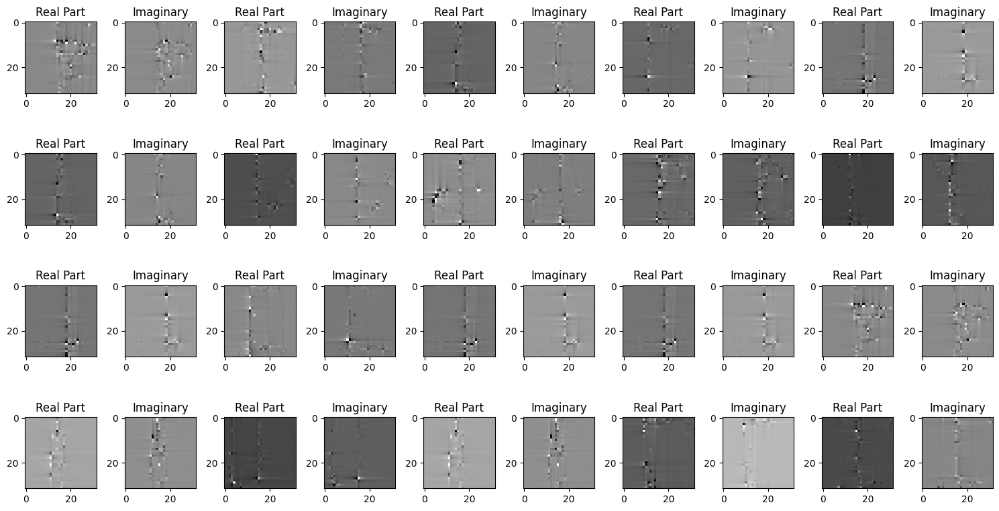

In [13]:
fig, axs = plt.subplots(4, 10, figsize=(15,8))
img_batch=x_train[200:220,:,:,:]

for i in range(0,10,2):
  for j in range(0,4):
    CSI_img = random.choice(img_batch)
    axs[j,i].imshow(np.array(CSI_img[0,:,:]), cmap='gist_gray')
    axs[j,i+1].imshow(np.array(CSI_img[1,:,:]), cmap='gist_gray')
    axs[j,i].set_title('Real Part')
    axs[j,i+1].set_title('Imaginary')
plt.tight_layout()

In [14]:
x_train = torch.tensor(x_train)
x_val = torch.tensor(x_val)
x_test = torch.tensor(x_test)
X_test = torch.tensor(X_test)

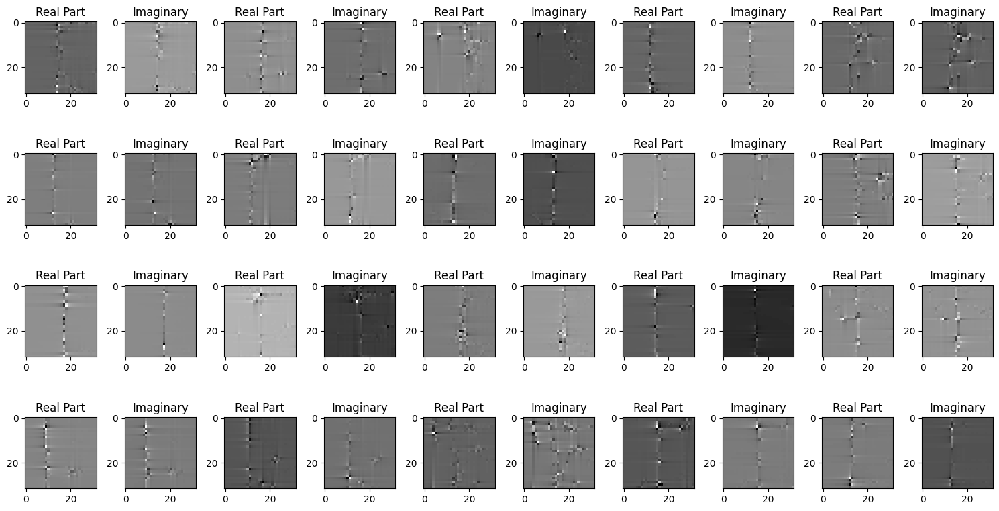

In [15]:
fig, axs = plt.subplots(4, 10, figsize=(15,8))
for i in range(0,10,2):
  for j in range(0,4):
    CSI_img = random.choice(x_train)
    axs[j,i].imshow(np.array(CSI_img[0,:,:]), cmap='gist_gray')
    axs[j,i+1].imshow(np.array(CSI_img[1,:,:]), cmap='gist_gray')
    axs[j,i].set_title('Real Part')
    axs[j,i+1].set_title('Imaginary')
plt.tight_layout()

In [16]:
# device
device = torch.device('cuda' if torch.cuda.is_available else 'cpu')
print(device)
x_train = x_train.to(device)
x_val = x_val.to(device)
x_test = x_test.to(device)
noise=torch.randn((1,512)).to(device)


cuda


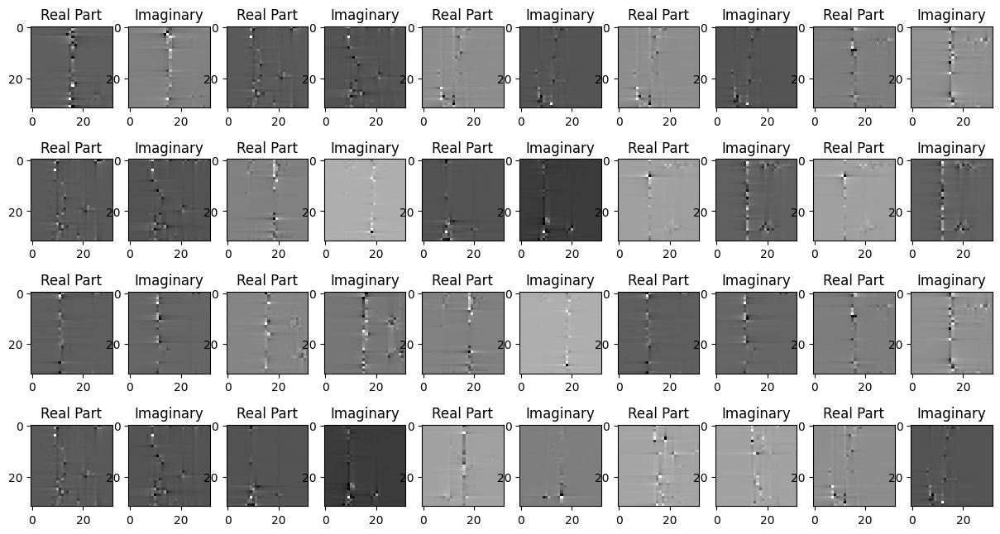

In [17]:
x_val_batch=x_val[0:20,:,:,:]
fig, axs = plt.subplots(4, 10, figsize=(15,8))
for i in range(0,10,2):
  for j in range(0,4):
    CSI_img = random.choice(x_val_batch.cpu())
    #print(CSI_img.shape)
    axs[j,i].imshow(np.array(CSI_img[0,:,:]), cmap='gist_gray')
    axs[j,i+1].imshow(np.array(CSI_img[1,:,:]), cmap='gist_gray')
    axs[j,i].set_title('Real Part')
    axs[j,i+1].set_title('Imaginary')
plt.show()

In [18]:
# model
model = acrnet(reduction=4, expansion=10).to(device)
#print(model)

I 07.15/18:26 <ipython-input-7-c7e33da91a25>:142 ] => Model ACRNet with reduction=4


torch.Size([5, 2, 32, 32])


<ipython-input-7-c7e33da91a25>:129: UserWarning: Sparse CSR tensor support is in beta state. If you miss a functionality in the sparse tensor support, please submit a feature request to https://github.com/pytorch/pytorch/issues. (Triggered internally at ../aten/src/ATen/SparseCsrTensorImpl.cpp:54.)
  out.to_sparse_csr()


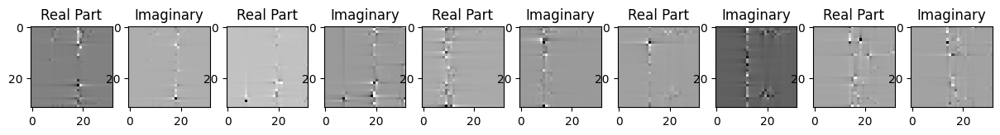

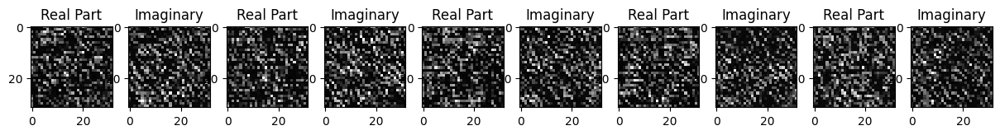

In [19]:
import itertools as it
with torch.no_grad():
  input=x_val[0:5,:,:,:]
  print(input.shape)
  model.eval()
  out = model(input)
  CSI_img_ = out.cpu()

  fig, axs = plt.subplots(1, 10, figsize=(15,8))
  for j, l in it.zip_longest(range(0, 5), range(1, 10,2)):
    in_img=input[j,0,:,:].cpu()
    axs[j*2].imshow(np.array(in_img.squeeze(0)), cmap='gist_gray')
    axs[j*2].set_title('Real Part')
    in_img=input[j,1,:,:].cpu()
    axs[l].imshow(np.array(in_img.squeeze(0)), cmap='gist_gray')
    axs[l].set_title('Imaginary')

  fig, axs = plt.subplots(1, 10, figsize=(15,8))
  for i, x in it.zip_longest(range(0, 5), range(1, 10,2)):

    #print(i)
    #CSI_img = random.choice(CSI_img_.cpu())
    img=CSI_img_[i,0,:,:]
    axs[i*2].imshow(np.array(img.squeeze(0)), cmap='gist_gray')
    axs[i*2].set_title('Real Part')
    img=CSI_img_[i,1,:,:]
    axs[x].imshow(np.array(img.squeeze(0)), cmap='gist_gray')
    axs[x].set_title('Imaginary')





  plt.show()

In [20]:
optimizer = optim.Adam(model.parameters(), lr=0.001, eps=1e-07)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=100, gamma=0.9)

In [21]:
# loss function
criterion = nn.MSELoss()

n_epochs = 1000
batch_size = 200
total_batches = int(x_train_length/batch_size)

tStart = time.time()

train_loss_history = []
val_loss_history = []

In [ ]:
if os.path.exists('/content/drive/MyDrive/_model_1100_new.pth'):
  checkpoint = torch.load('/content/drive/MyDrive/_model_1100_new.pth',map_location=torch.device('cuda'))
  model.load_state_dict(checkpoint)

In [ ]:
checkpoint = torch.load('/content/drive/MyDrive/_model_1000_new.pth')
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
start_epoch = checkpoint['epoch']

In [19]:
torch.cuda.empty_cache()

In [21]:
!pip install numba

In [24]:
with torch.no_grad():
    torch.cuda.empty_cache()

In [22]:
x_val=x_val[0:10000,:,:,:]

In [23]:
x_val_1=x_val = x_val.to(device)

Epoch-1 lr: 0.001
Loss:  0.0008027408621273935
torch.Size([5, 2, 32, 32])


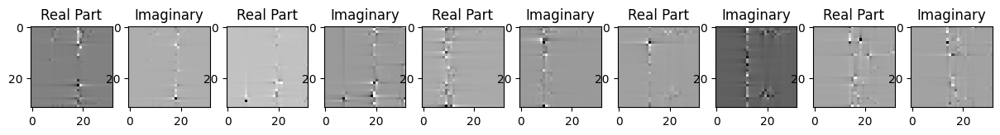

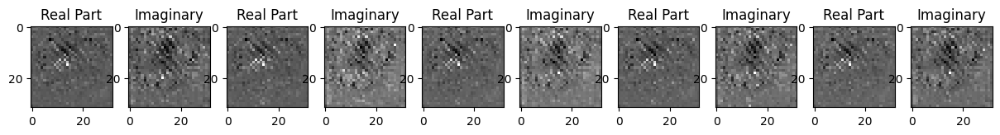

Saving model to: /content/drive/MyDrive/saved_model/_model_0_outdoor_512.pth
Epoch-2 lr: 0.001
Loss:  0.0008027197909541428
torch.Size([5, 2, 32, 32])


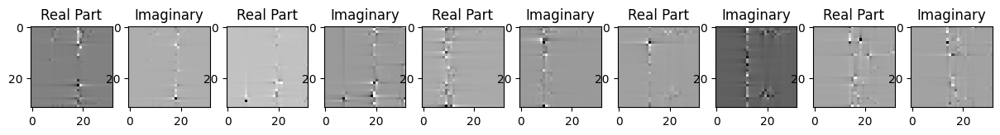

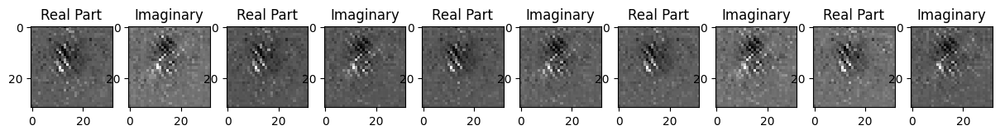

Epoch-3 lr: 0.001
Loss:  0.0008027071016840637
torch.Size([5, 2, 32, 32])


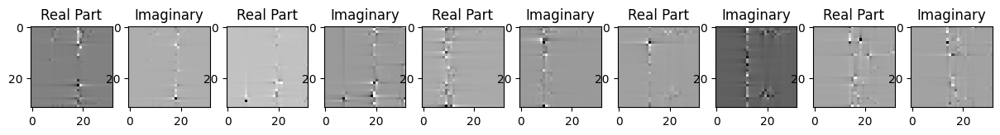

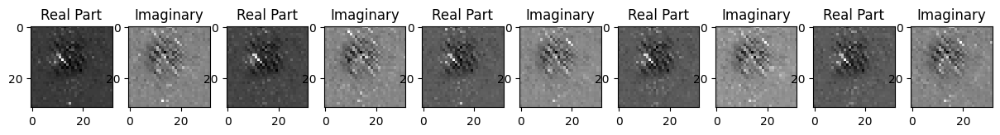

Epoch-4 lr: 0.001
Loss:  0.0008029410964809358
torch.Size([5, 2, 32, 32])


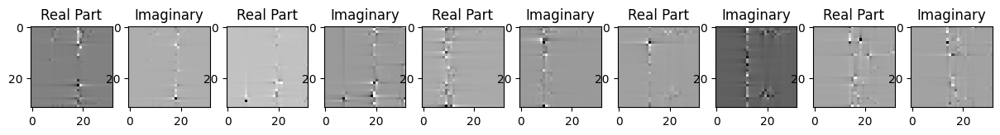

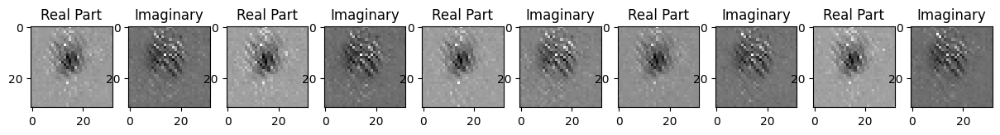

Epoch-5 lr: 0.001
Loss:  0.0008029346354305744
torch.Size([5, 2, 32, 32])


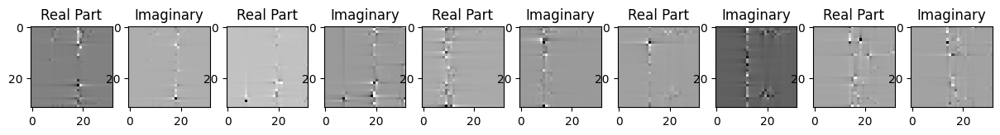

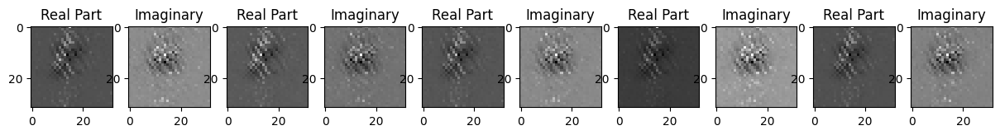

Epoch-6 lr: 0.001
Loss:  0.0008001375827006996
torch.Size([5, 2, 32, 32])


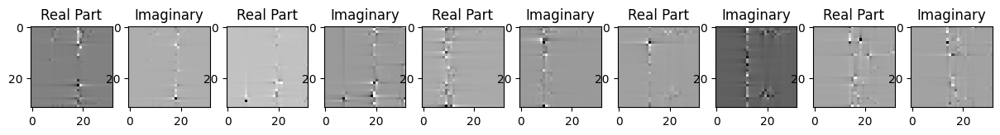

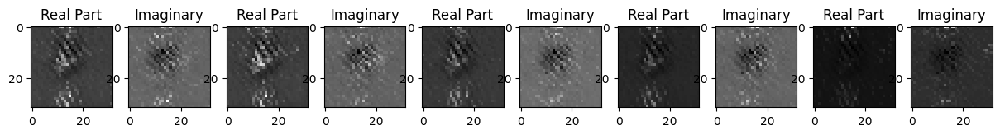

Epoch-7 lr: 0.001
Loss:  0.0007142113754525781
torch.Size([5, 2, 32, 32])


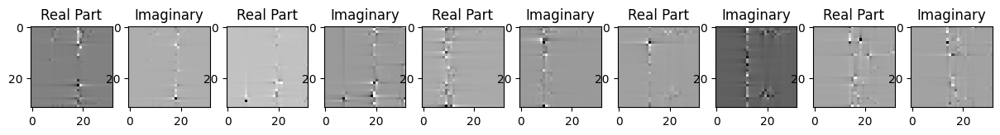

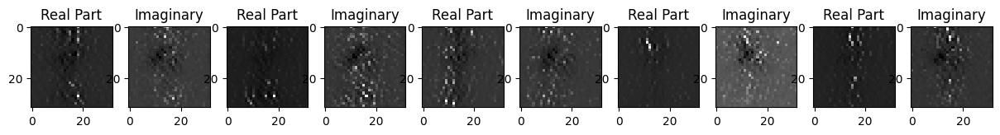

Epoch-8 lr: 0.001
Loss:  0.00048228271771222353
torch.Size([5, 2, 32, 32])


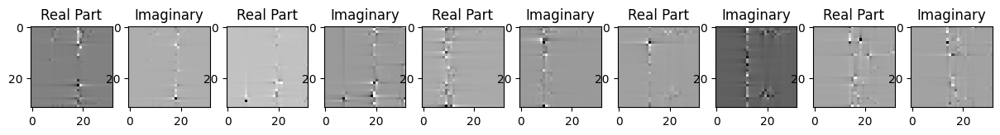

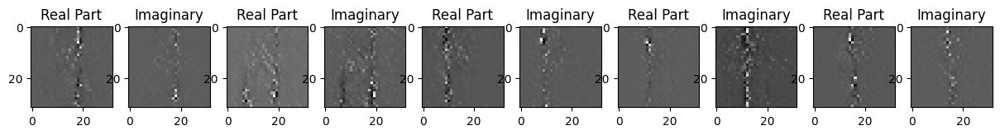

Epoch-9 lr: 0.001
Loss:  0.00033826802973635495
torch.Size([5, 2, 32, 32])


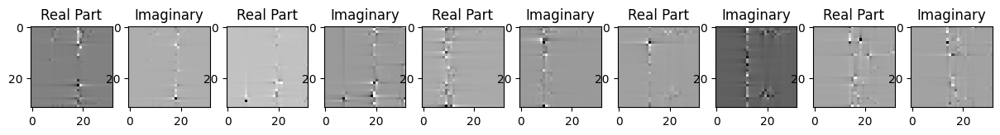

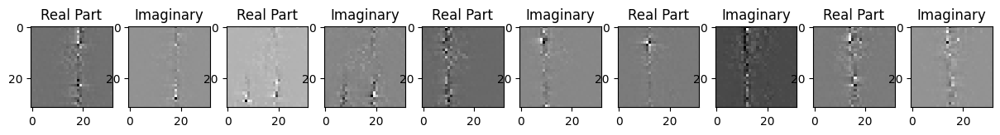

Epoch-10 lr: 0.001
Loss:  0.0002598619321361184
torch.Size([5, 2, 32, 32])


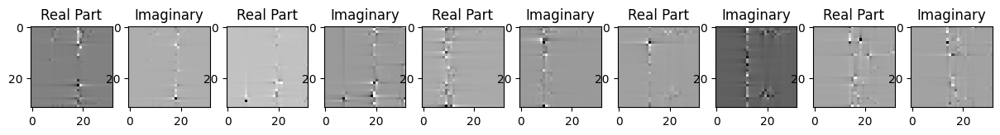

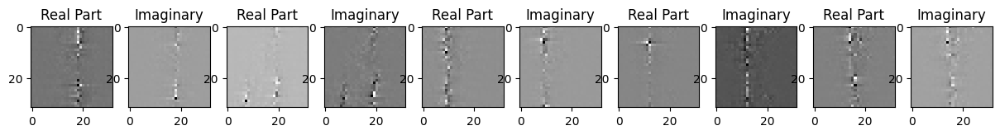

Epoch-11 lr: 0.001
Loss:  0.00021878848201595247
torch.Size([5, 2, 32, 32])


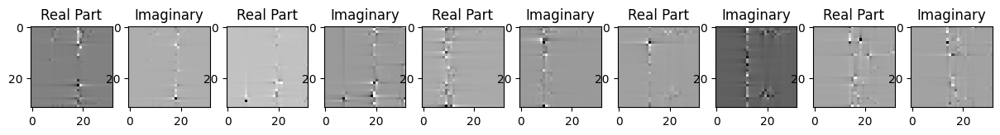

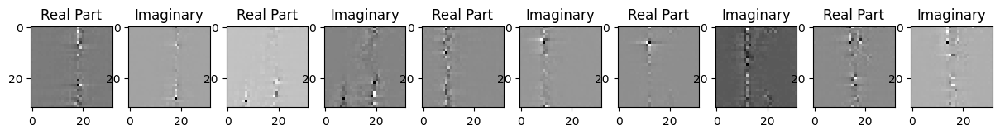

Epoch-12 lr: 0.001
Loss:  0.00019622754189185798
torch.Size([5, 2, 32, 32])


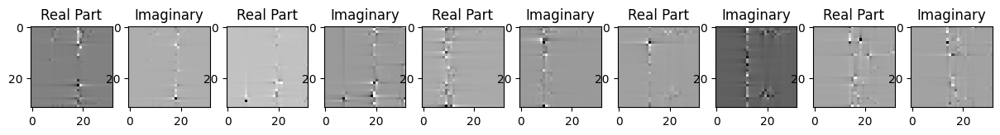

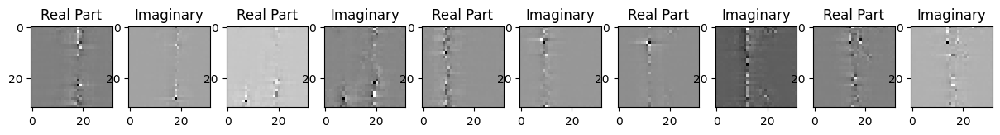

Epoch-13 lr: 0.001
Loss:  0.0001696775871096179
torch.Size([5, 2, 32, 32])


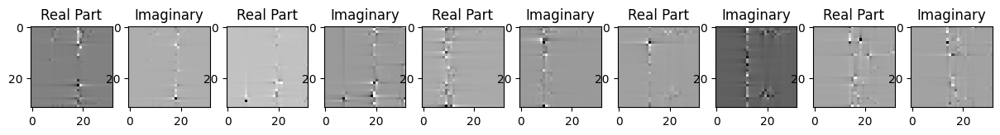

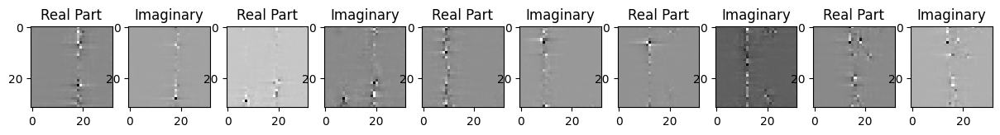

Epoch-14 lr: 0.001
Loss:  0.00015724280092399567
torch.Size([5, 2, 32, 32])


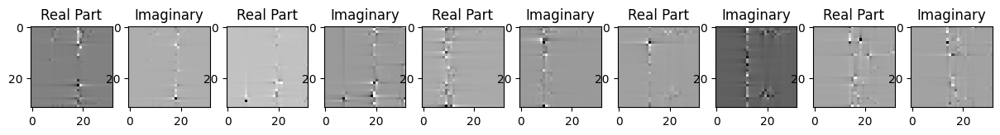

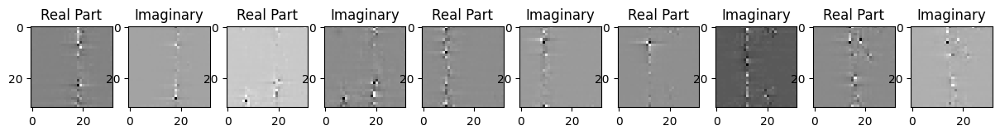

Epoch-15 lr: 0.001
Loss:  0.00015459988208021969
torch.Size([5, 2, 32, 32])


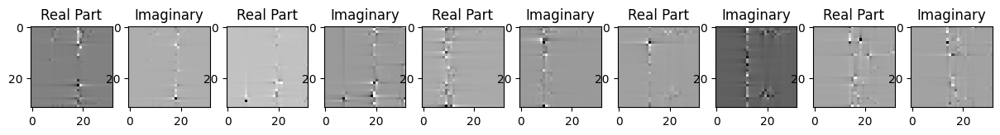

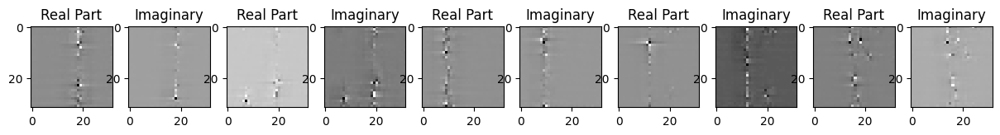

Epoch-16 lr: 0.001
Loss:  0.00014326242671813816
torch.Size([5, 2, 32, 32])


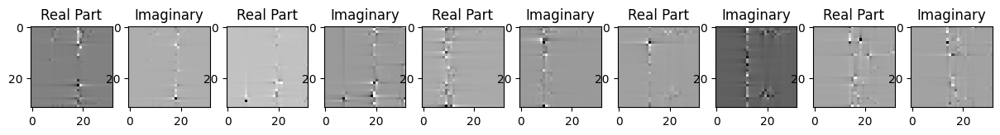

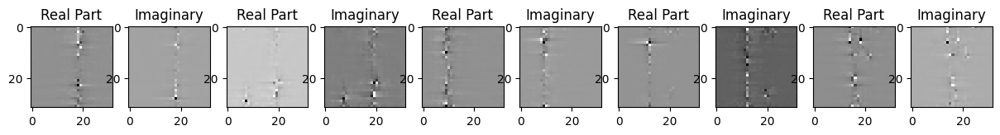

Epoch-17 lr: 0.001
Loss:  0.00013425908400677145
torch.Size([5, 2, 32, 32])


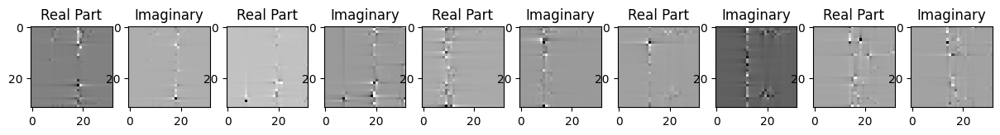

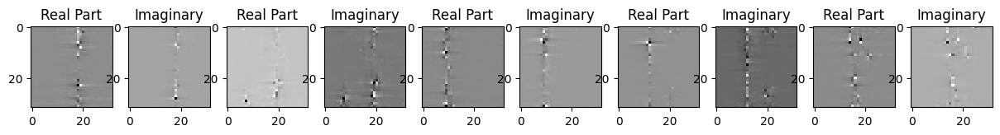

Epoch-18 lr: 0.001
Loss:  0.0001284683239646256
torch.Size([5, 2, 32, 32])


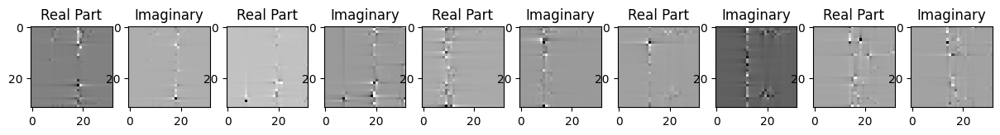

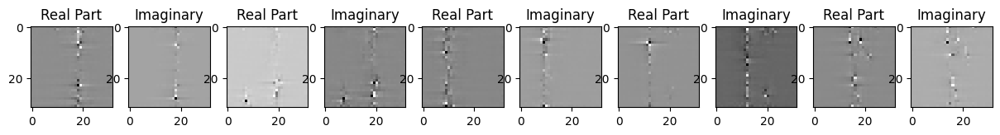

Epoch-19 lr: 0.001
Loss:  0.00012911434168927372
torch.Size([5, 2, 32, 32])


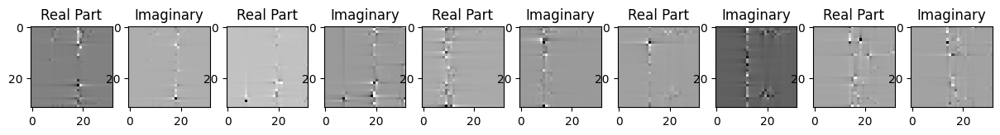

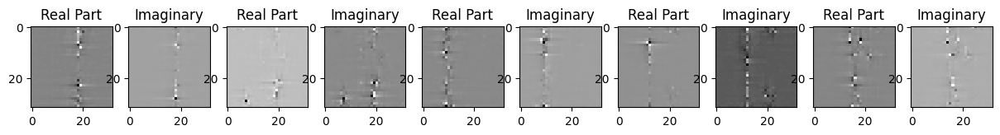

Epoch-20 lr: 0.001
Loss:  0.00012483388127293438
torch.Size([5, 2, 32, 32])


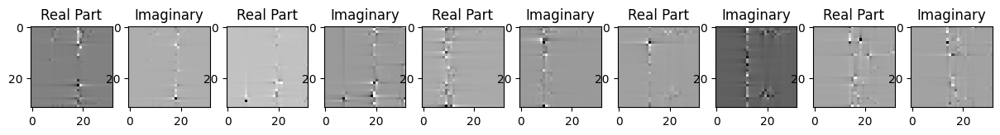

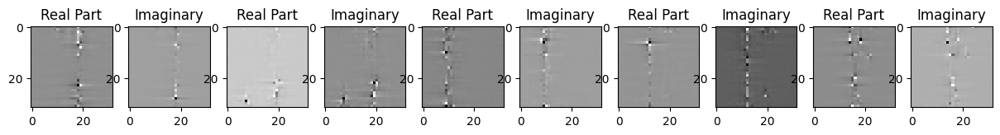

Epoch-21 lr: 0.001
Loss:  0.00012650334974750876
torch.Size([5, 2, 32, 32])


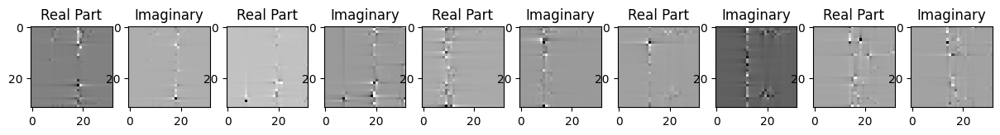

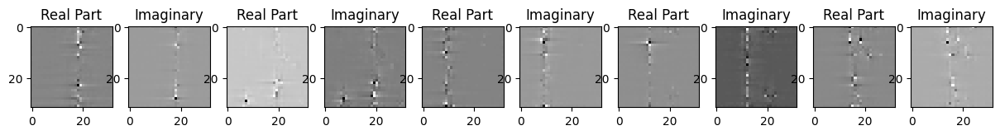

Epoch-22 lr: 0.001
Loss:  0.00012285968114156276
torch.Size([5, 2, 32, 32])


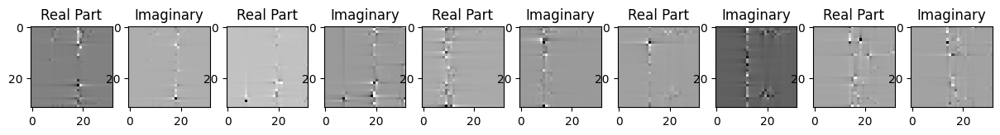

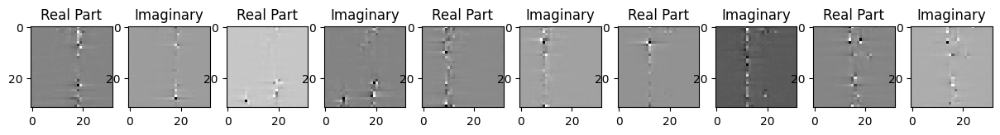

Epoch-23 lr: 0.001
Loss:  0.00014131235366221517
torch.Size([5, 2, 32, 32])


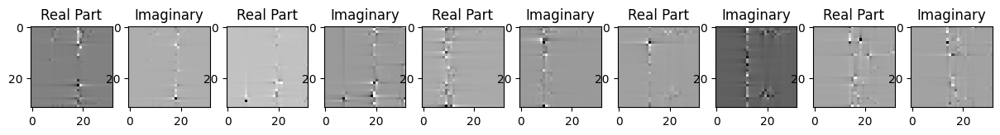

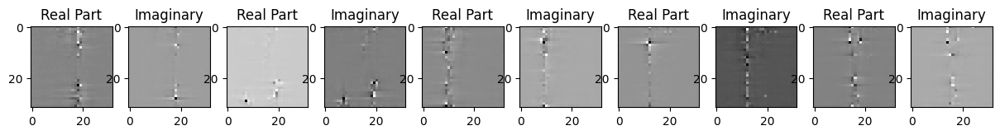

Epoch-24 lr: 0.001
Loss:  0.00010934476449619979
torch.Size([5, 2, 32, 32])


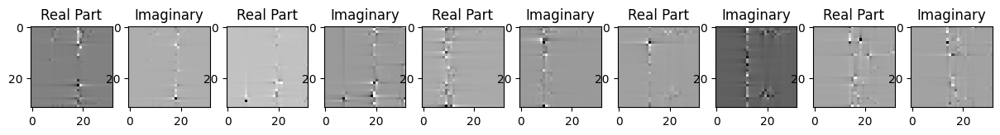

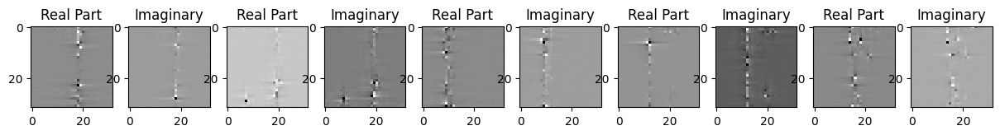

Epoch-25 lr: 0.001
Loss:  0.0001059291826095432
torch.Size([5, 2, 32, 32])


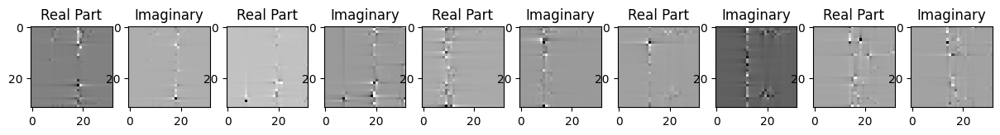

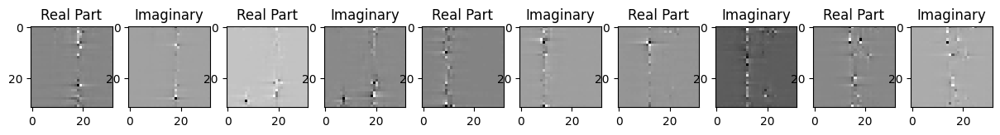

Epoch-26 lr: 0.001
Loss:  0.00012549142411444336
torch.Size([5, 2, 32, 32])


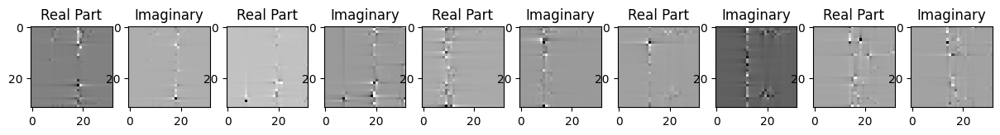

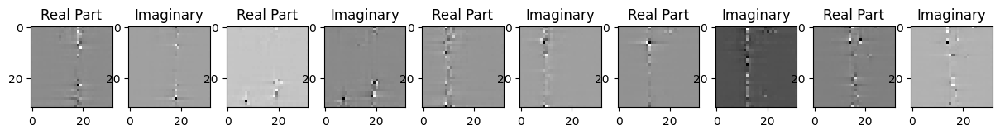

Epoch-27 lr: 0.001
Loss:  0.00010788388317450881
torch.Size([5, 2, 32, 32])


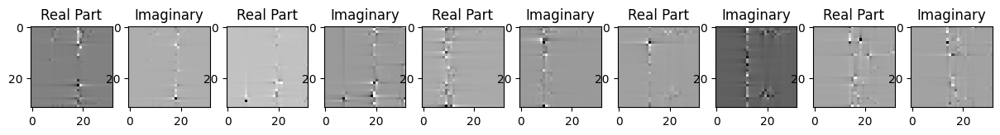

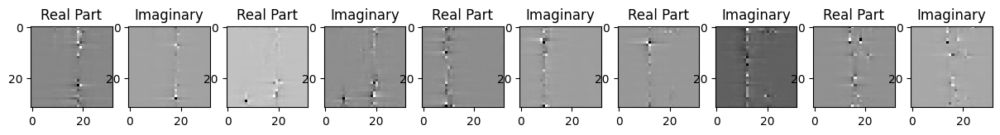

Epoch-28 lr: 0.001
Loss:  0.00010152072354685515
torch.Size([5, 2, 32, 32])


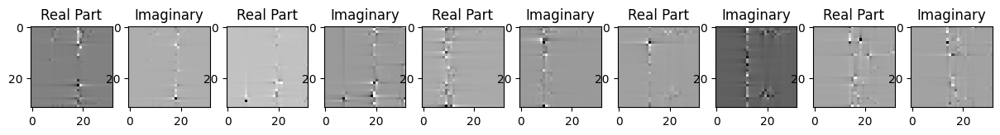

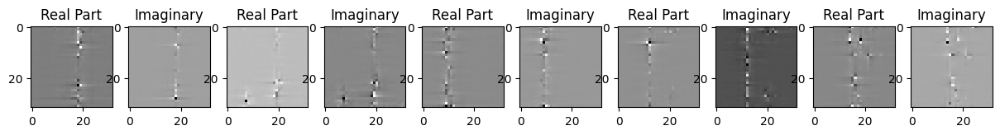

Epoch-29 lr: 0.001
Loss:  0.00011284997162874788
torch.Size([5, 2, 32, 32])


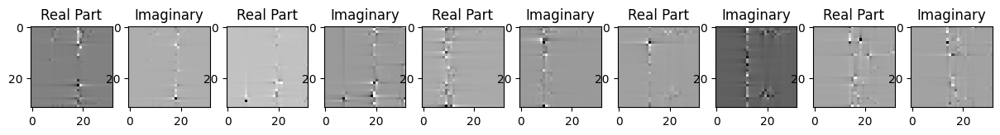

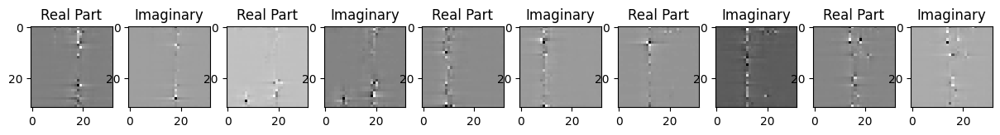

Epoch-30 lr: 0.001
Loss:  9.219189814757556e-05
torch.Size([5, 2, 32, 32])


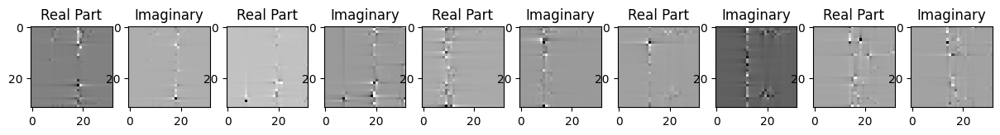

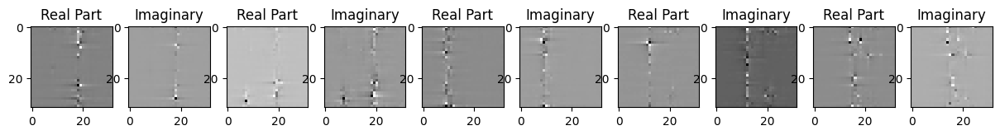

Epoch-31 lr: 0.001
Loss:  9.120104368776083e-05
torch.Size([5, 2, 32, 32])


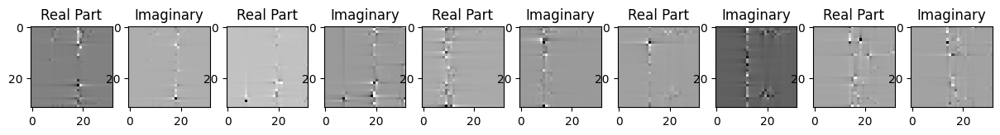

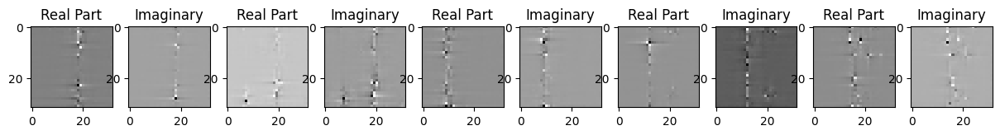

Epoch-32 lr: 0.001
Loss:  0.00021533788822125643
torch.Size([5, 2, 32, 32])


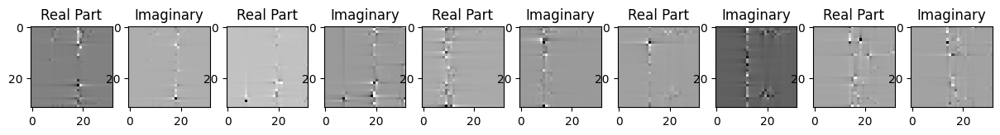

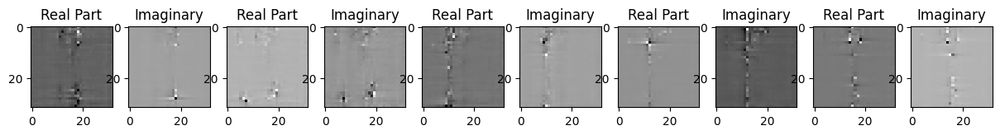

Epoch-33 lr: 0.001
Loss:  0.00010480303171789274
torch.Size([5, 2, 32, 32])


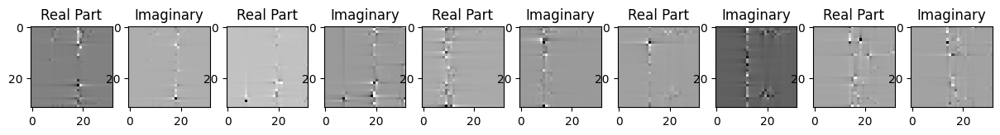

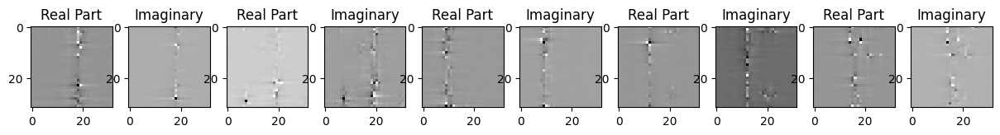

Epoch-34 lr: 0.001
Loss:  0.0008999958517961204
torch.Size([5, 2, 32, 32])


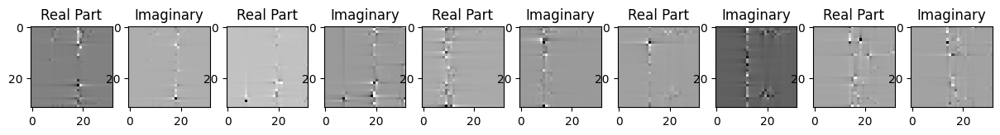

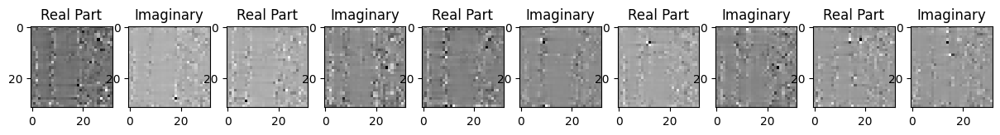

Epoch-35 lr: 0.001
Loss:  0.0005685429205186665
torch.Size([5, 2, 32, 32])


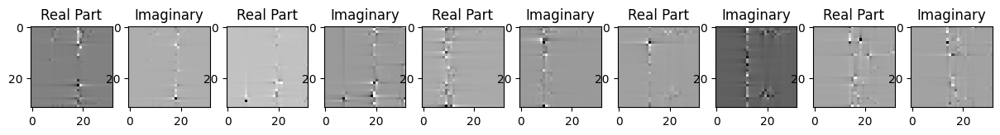

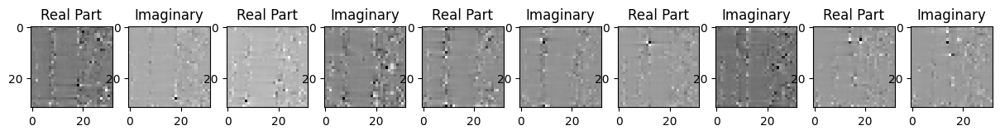

Epoch-36 lr: 0.001
Loss:  8.475846698274836e-05
torch.Size([5, 2, 32, 32])


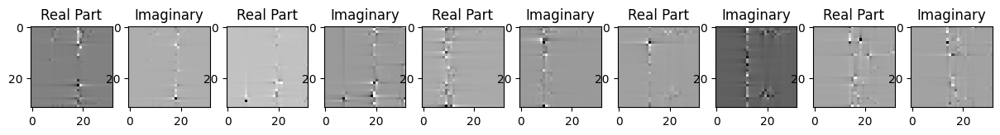

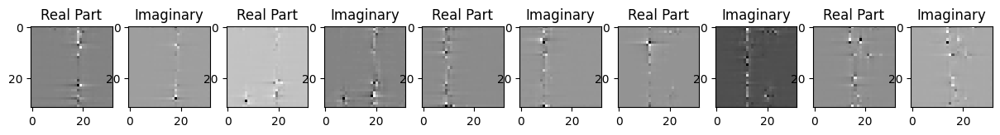

Epoch-37 lr: 0.001
Loss:  9.26013890421018e-05
torch.Size([5, 2, 32, 32])


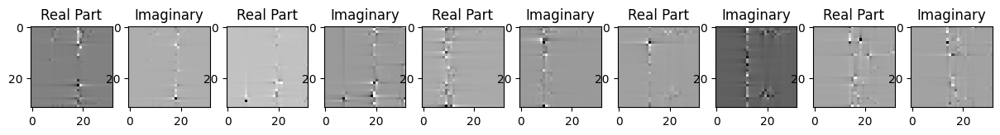

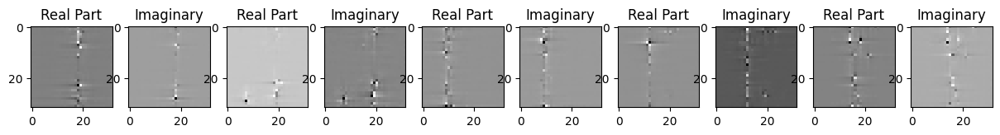

Epoch-38 lr: 0.001
Loss:  8.205141784856096e-05
torch.Size([5, 2, 32, 32])


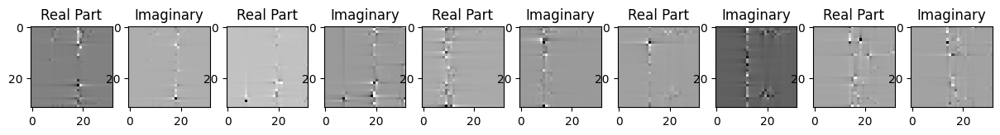

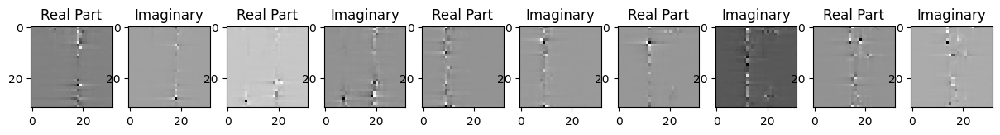

Epoch-39 lr: 0.001
Loss:  7.535330223618075e-05
torch.Size([5, 2, 32, 32])


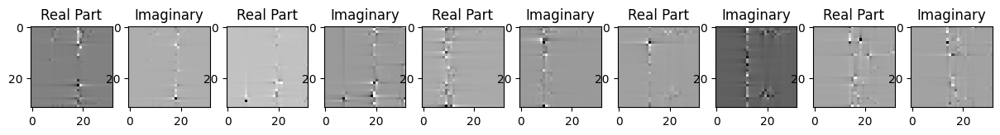

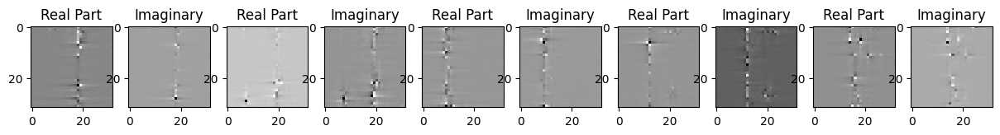

Epoch-40 lr: 0.001
Loss:  0.0001469139097025618
torch.Size([5, 2, 32, 32])


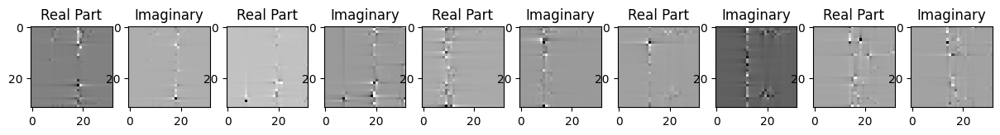

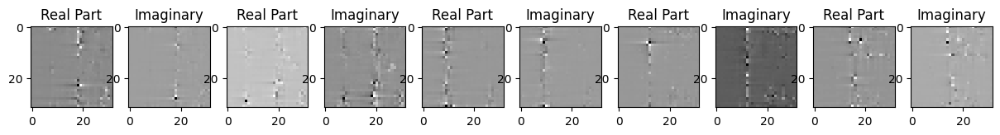

Epoch-41 lr: 0.001
Loss:  9.720184607431293e-05
torch.Size([5, 2, 32, 32])


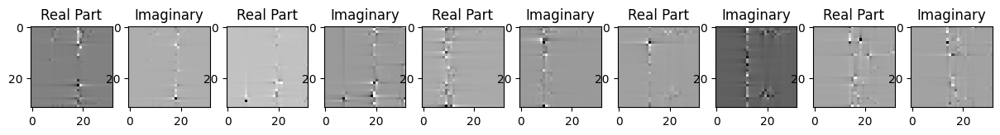

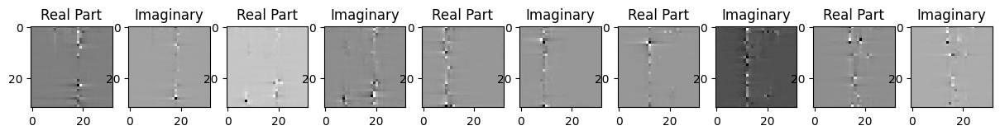

Epoch-42 lr: 0.001
Loss:  8.889136370271444e-05
torch.Size([5, 2, 32, 32])


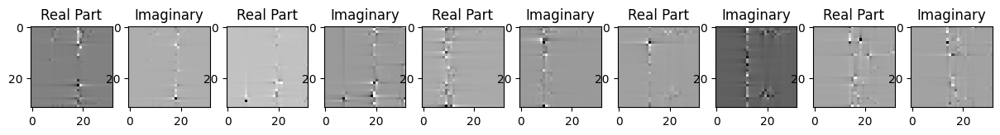

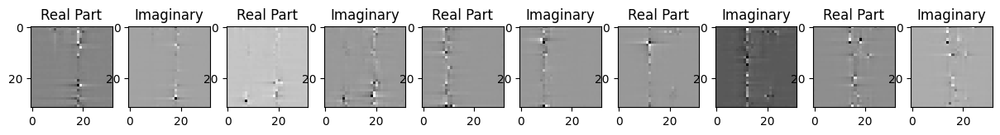

Epoch-43 lr: 0.001
Loss:  0.00010159341763937846
torch.Size([5, 2, 32, 32])


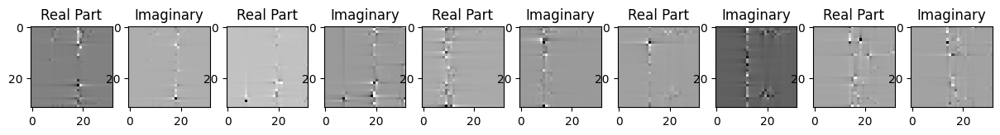

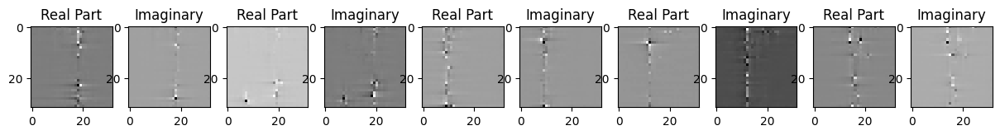

Epoch-44 lr: 0.001
Loss:  0.00013150453742127866
torch.Size([5, 2, 32, 32])


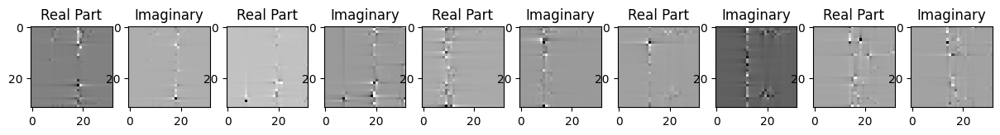

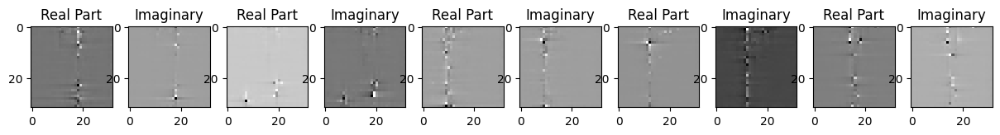

Epoch-45 lr: 0.001
Loss:  9.041444718604907e-05
torch.Size([5, 2, 32, 32])


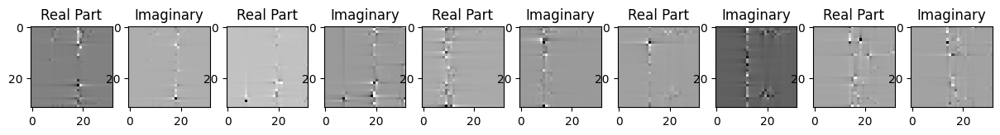

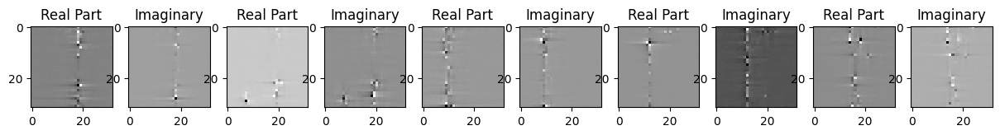

Epoch-46 lr: 0.001
Loss:  0.0001153177727246657
torch.Size([5, 2, 32, 32])


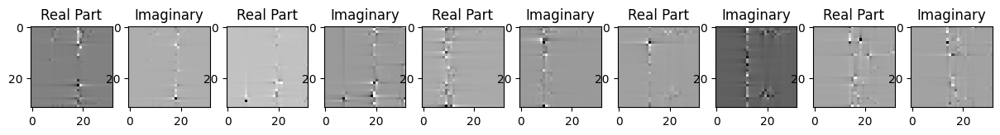

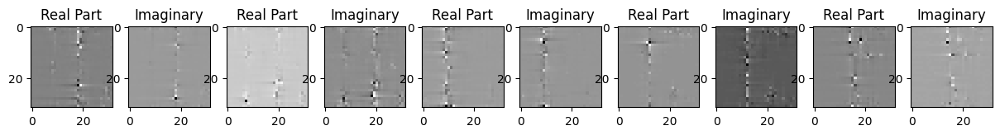

Epoch-47 lr: 0.001
Loss:  0.0001015599918900989
torch.Size([5, 2, 32, 32])


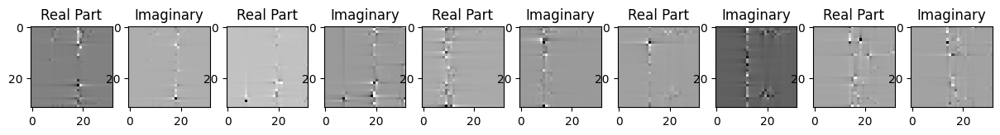

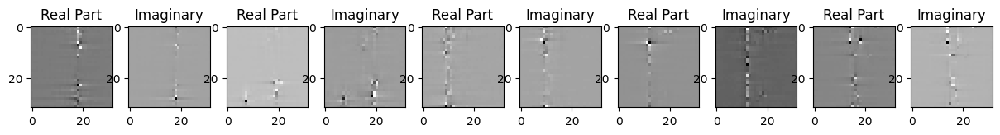

Epoch-48 lr: 0.001
Loss:  0.00011711903789546341
torch.Size([5, 2, 32, 32])


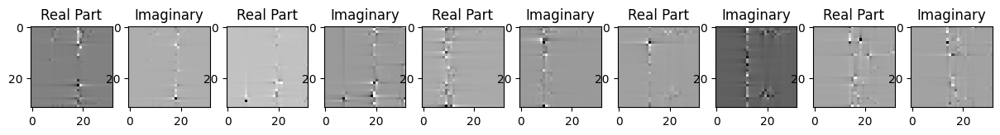

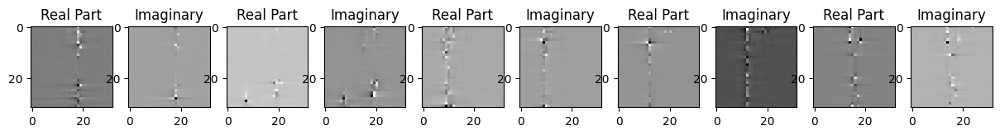

Epoch-49 lr: 0.001
Loss:  0.00018712932069320232
torch.Size([5, 2, 32, 32])


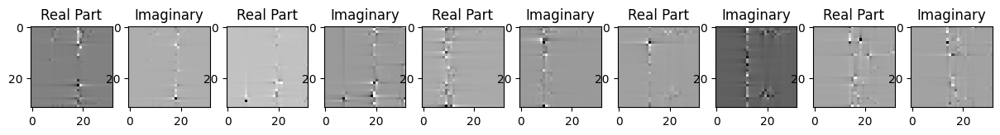

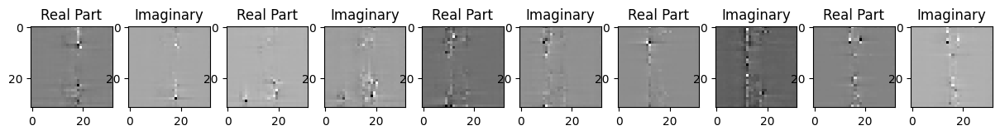

Epoch-50 lr: 0.001
Loss:  0.00015753917978145182
torch.Size([5, 2, 32, 32])


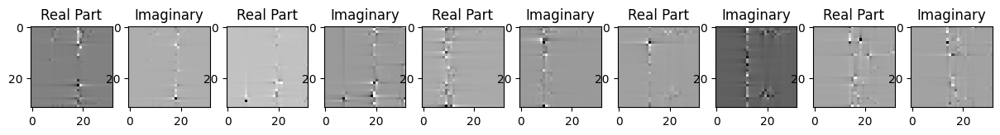

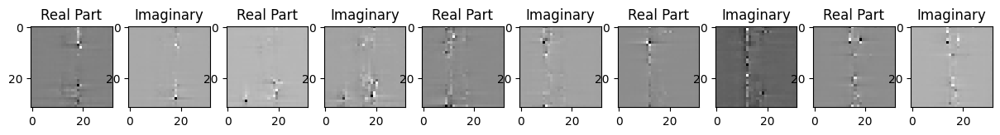

Epoch-51 lr: 0.001
Loss:  7.248162000905722e-05
torch.Size([5, 2, 32, 32])


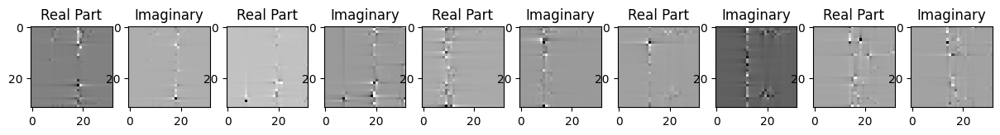

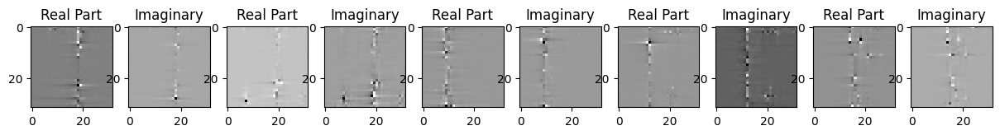

Saving model to: /content/drive/MyDrive/saved_model/_model_50_outdoor_512.pth
Epoch-52 lr: 0.001
Loss:  7.16541035217233e-05
torch.Size([5, 2, 32, 32])


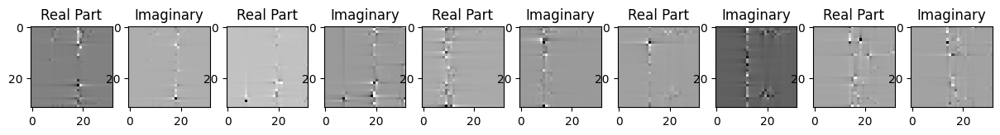

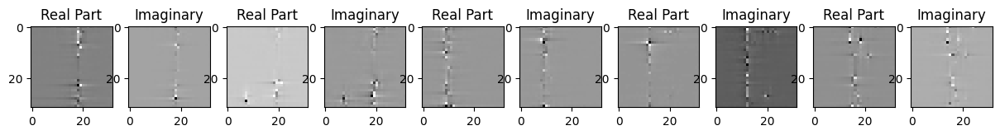

Epoch-53 lr: 0.001
Loss:  0.0001252202782779932
torch.Size([5, 2, 32, 32])


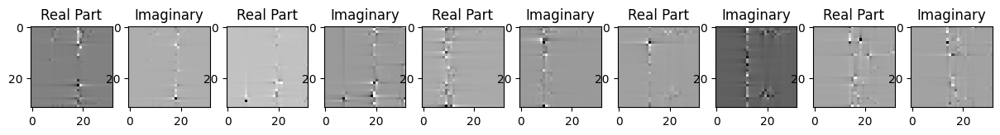

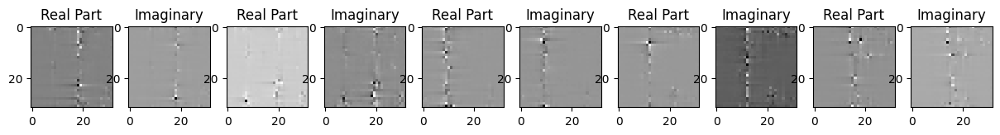

Epoch-54 lr: 0.001
Loss:  9.322296682512388e-05
torch.Size([5, 2, 32, 32])


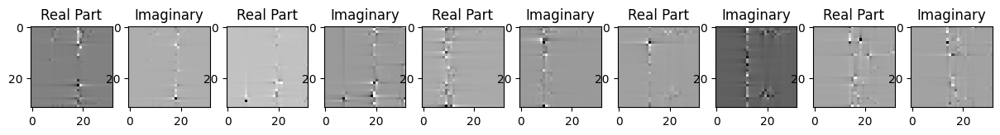

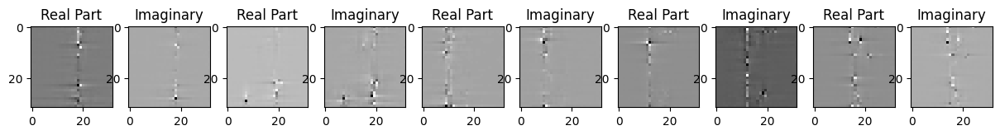

Epoch-55 lr: 0.001
Loss:  8.2762235251721e-05
torch.Size([5, 2, 32, 32])


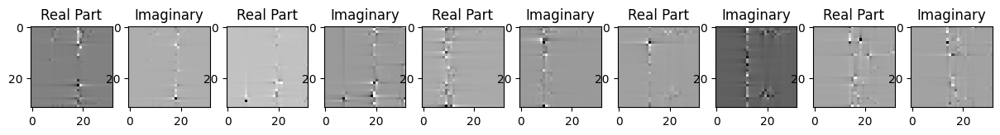

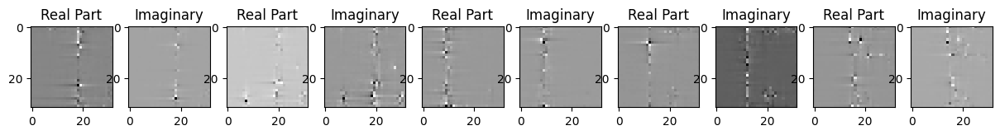

Epoch-56 lr: 0.001
Loss:  7.333527901209891e-05
torch.Size([5, 2, 32, 32])


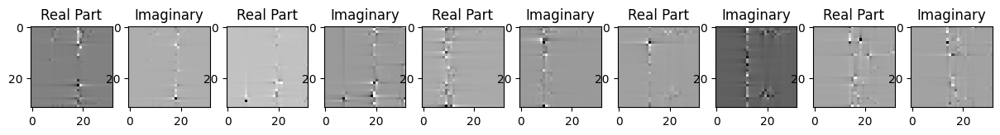

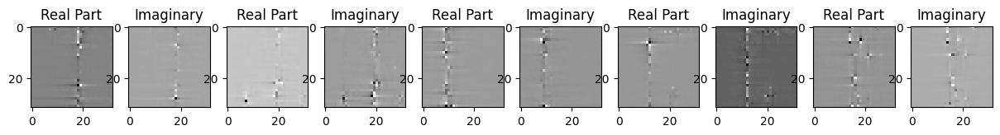

Epoch-57 lr: 0.001
Loss:  0.00016951479483395815
torch.Size([5, 2, 32, 32])


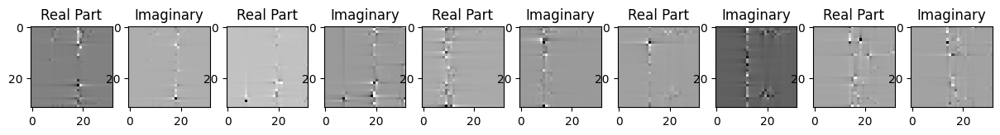

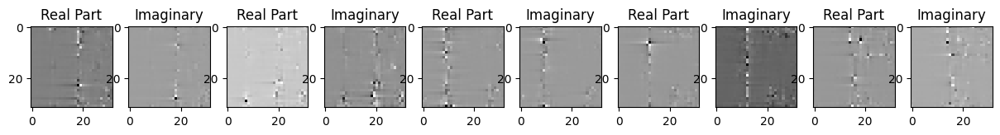

Epoch-58 lr: 0.001
Loss:  0.00021634773293044418
torch.Size([5, 2, 32, 32])


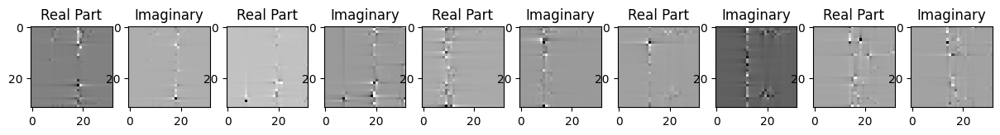

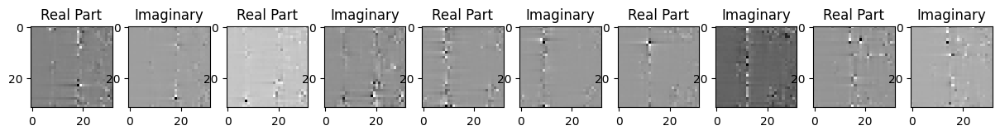

Epoch-59 lr: 0.001
Loss:  0.0002945396408904344
torch.Size([5, 2, 32, 32])


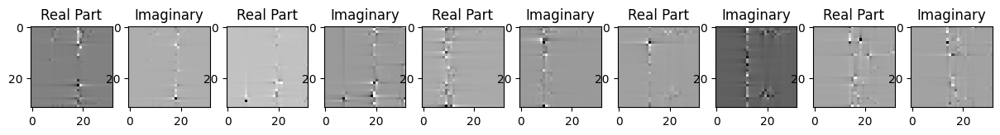

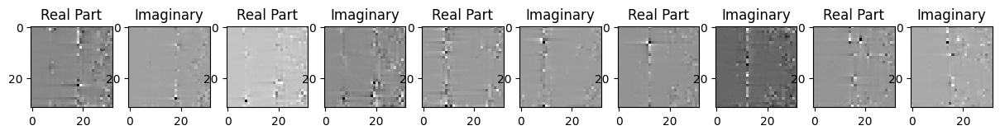

Epoch-60 lr: 0.001
Loss:  0.00010003706847783178
torch.Size([5, 2, 32, 32])


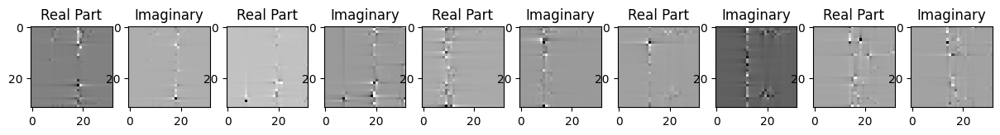

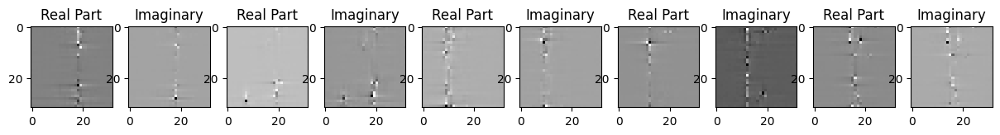

Epoch-61 lr: 0.001
Loss:  0.00014852173626422882
torch.Size([5, 2, 32, 32])


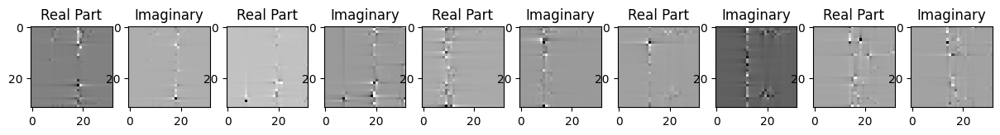

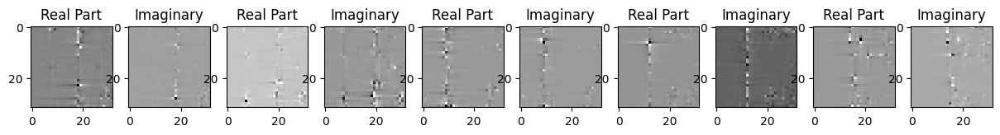

Epoch-62 lr: 0.001
Loss:  0.00047871621791273355
torch.Size([5, 2, 32, 32])


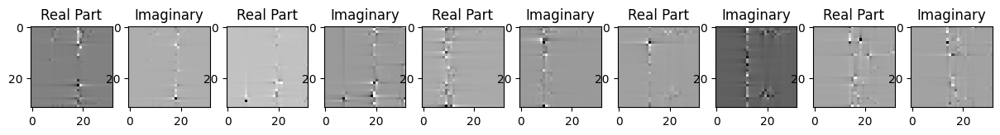

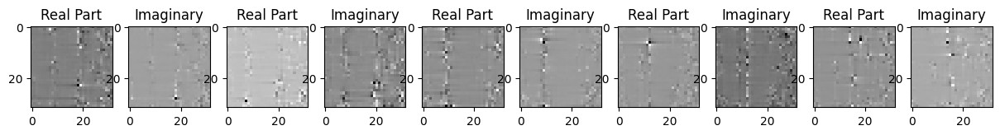

Epoch-63 lr: 0.001
Loss:  9.367890015710145e-05
torch.Size([5, 2, 32, 32])


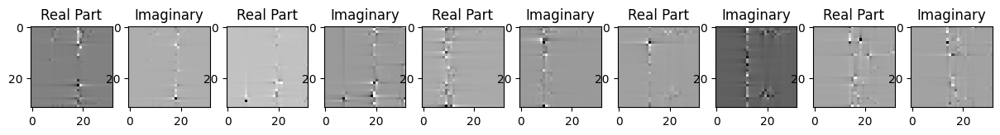

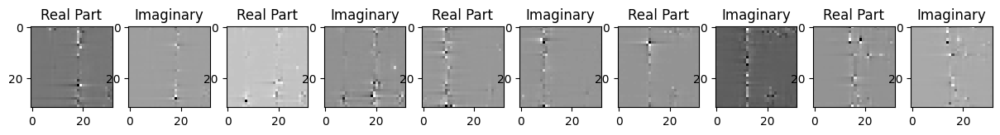

Epoch-64 lr: 0.001
Loss:  7.330015796469525e-05
torch.Size([5, 2, 32, 32])


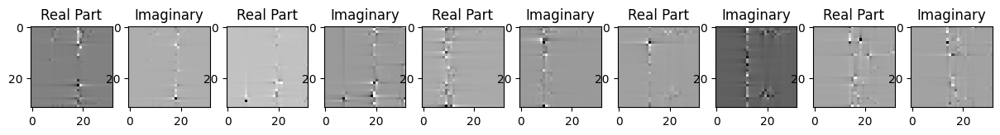

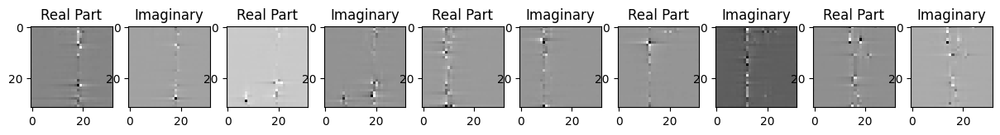

Epoch-65 lr: 0.001
Loss:  9.331651381216943e-05
torch.Size([5, 2, 32, 32])


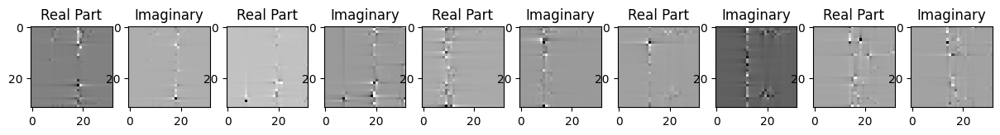

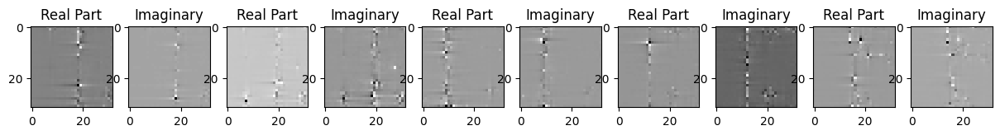

Epoch-66 lr: 0.001
Loss:  0.00014401841326616704
torch.Size([5, 2, 32, 32])


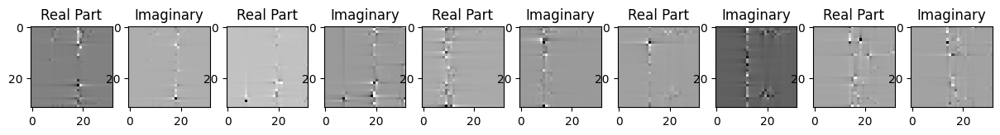

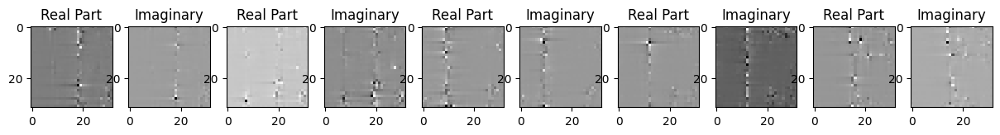

Epoch-67 lr: 0.001
Loss:  0.00019511475693434477
torch.Size([5, 2, 32, 32])


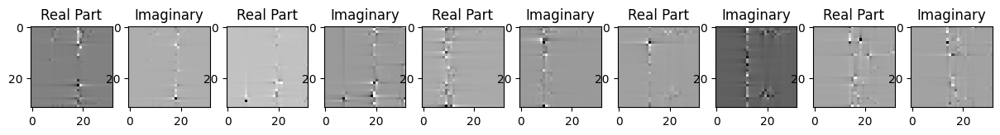

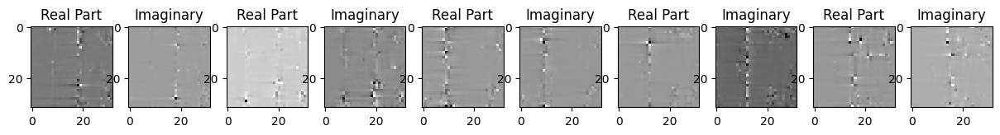

Epoch-68 lr: 0.001
Loss:  0.00018344962154515088
torch.Size([5, 2, 32, 32])


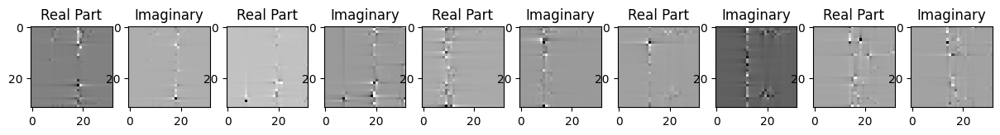

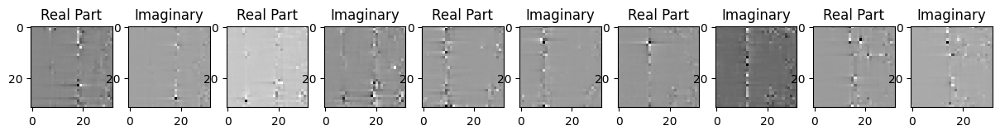

Epoch-69 lr: 0.001
Loss:  5.741783752455376e-05
torch.Size([5, 2, 32, 32])


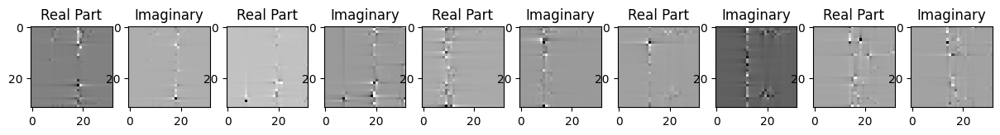

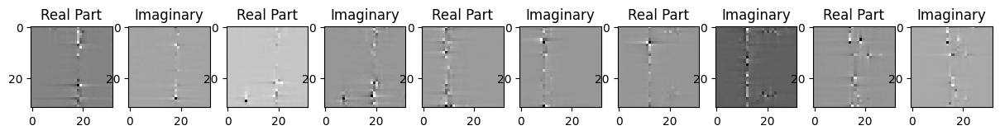

Epoch-70 lr: 0.001
Loss:  6.181853677844629e-05
torch.Size([5, 2, 32, 32])


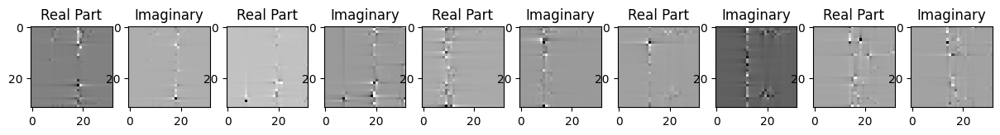

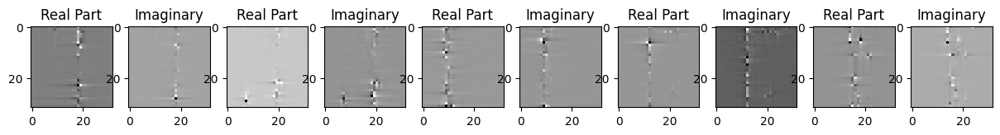

Epoch-71 lr: 0.001
Loss:  6.985801155678928e-05
torch.Size([5, 2, 32, 32])


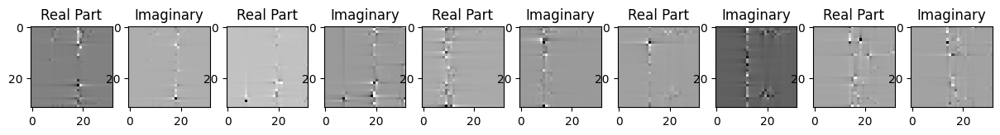

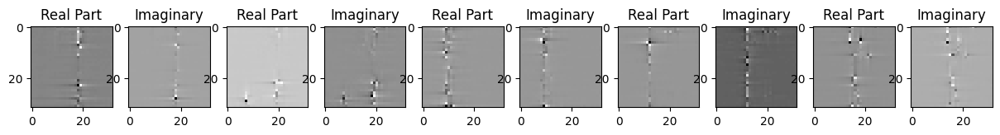

Epoch-72 lr: 0.001
Loss:  6.066317291697487e-05
torch.Size([5, 2, 32, 32])


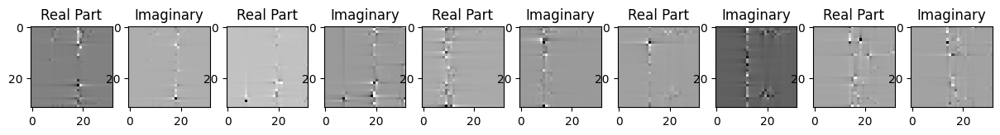

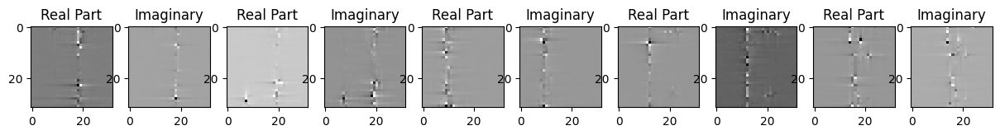

Epoch-73 lr: 0.001
Loss:  0.00010350238881073892
torch.Size([5, 2, 32, 32])


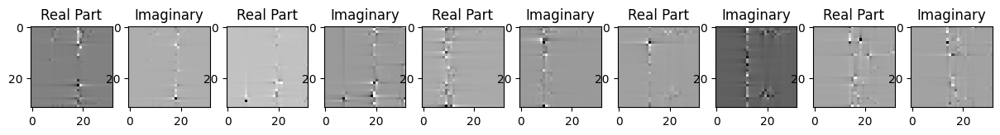

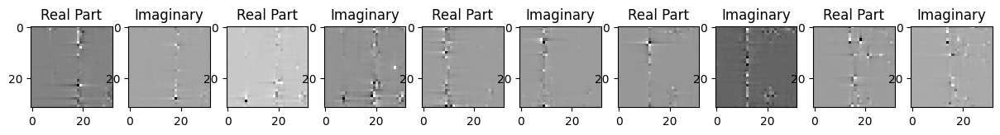

Epoch-74 lr: 0.001
Loss:  5.529294503503479e-05
torch.Size([5, 2, 32, 32])


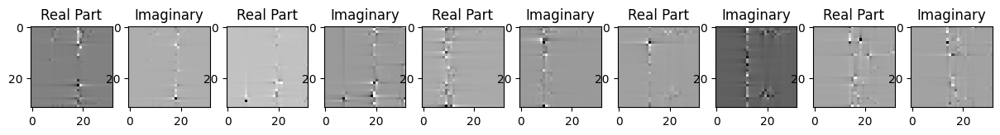

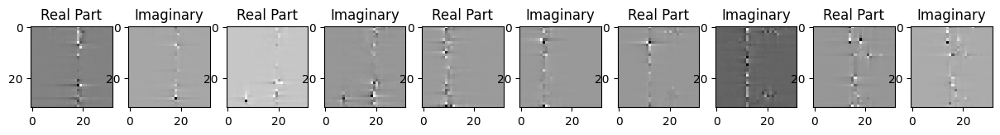

Epoch-75 lr: 0.001
Loss:  0.00010335499973734841
torch.Size([5, 2, 32, 32])


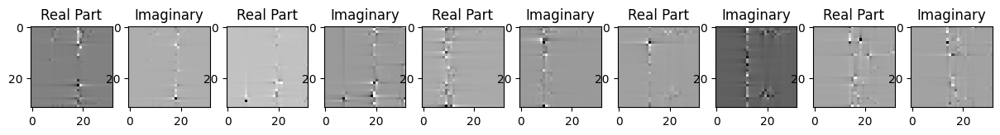

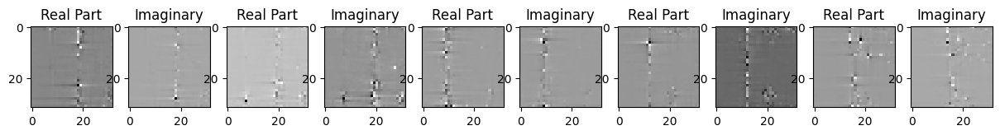

Epoch-76 lr: 0.001
Loss:  7.74290892877616e-05
torch.Size([5, 2, 32, 32])


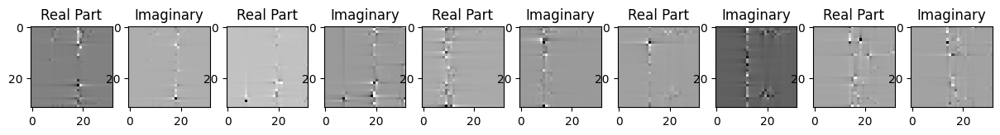

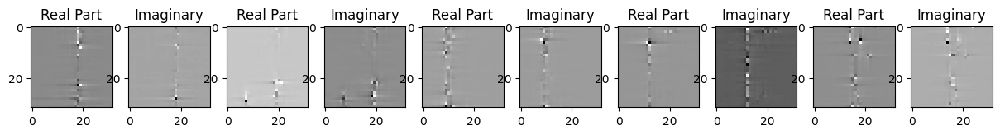

Epoch-77 lr: 0.001
Loss:  7.427298987749964e-05
torch.Size([5, 2, 32, 32])


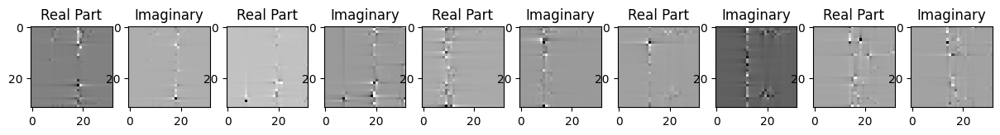

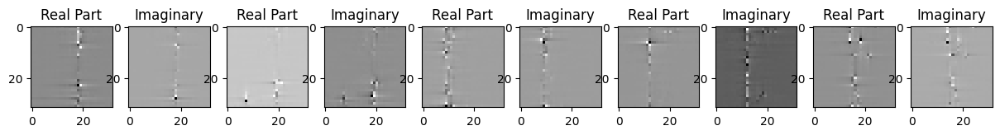

Epoch-78 lr: 0.001
Loss:  0.00011935381917282939
torch.Size([5, 2, 32, 32])


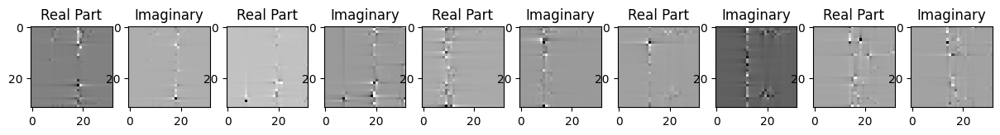

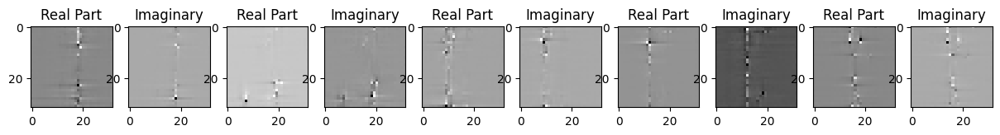

Epoch-79 lr: 0.001
Loss:  5.573223825194873e-05
torch.Size([5, 2, 32, 32])


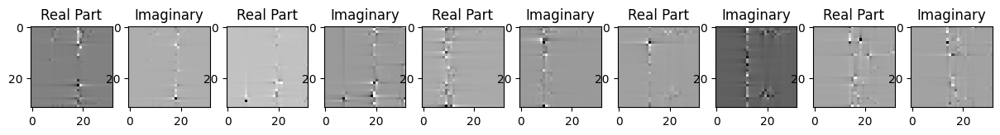

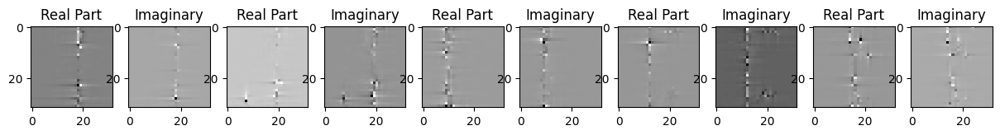

Epoch-80 lr: 0.001
Loss:  6.278729415498674e-05
torch.Size([5, 2, 32, 32])


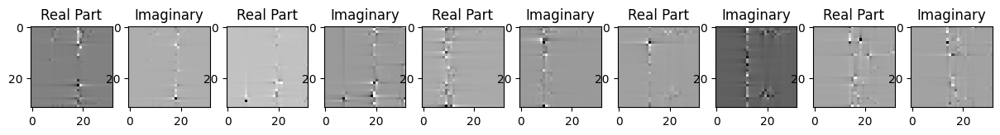

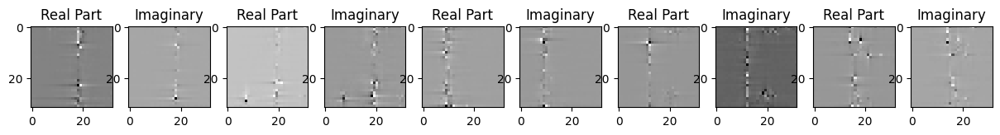

Epoch-81 lr: 0.001
Loss:  0.00013285579916555434
torch.Size([5, 2, 32, 32])


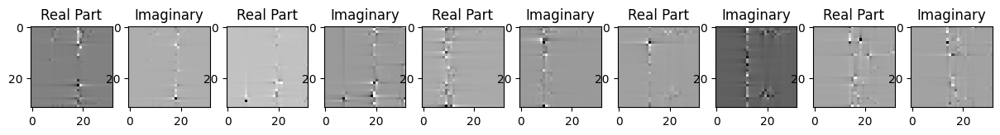

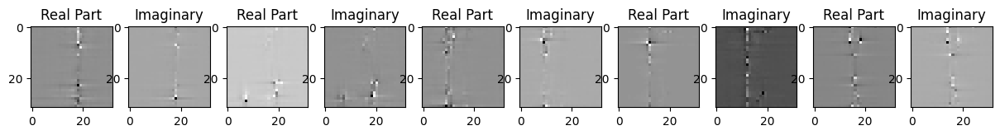

Epoch-82 lr: 0.001
Loss:  8.301954949274659e-05
torch.Size([5, 2, 32, 32])


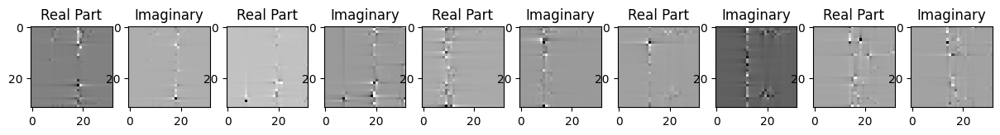

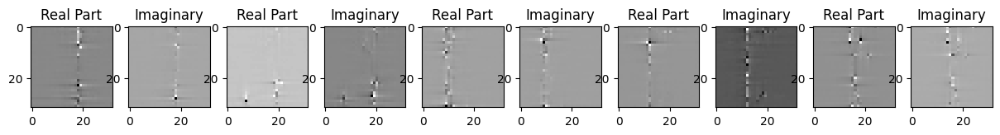

Epoch-83 lr: 0.001
Loss:  5.4747197282267734e-05
torch.Size([5, 2, 32, 32])


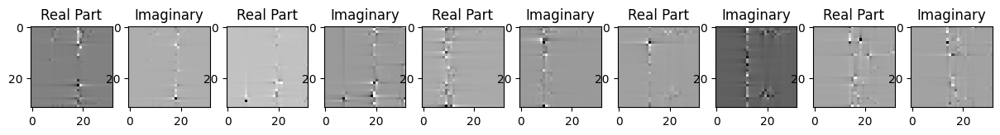

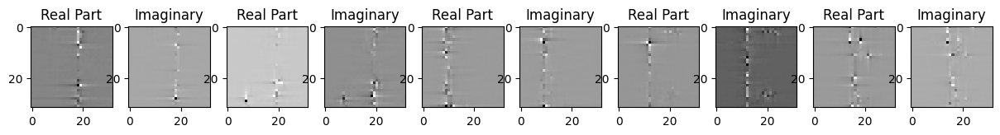

Epoch-84 lr: 0.001
Loss:  6.5751897636801e-05
torch.Size([5, 2, 32, 32])


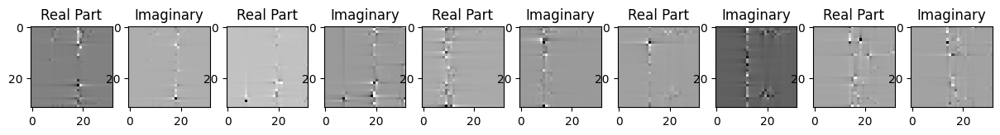

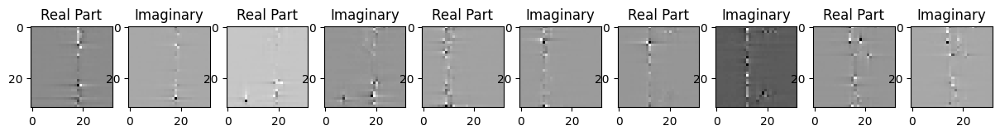

Epoch-85 lr: 0.001
Loss:  8.206963684642687e-05
torch.Size([5, 2, 32, 32])


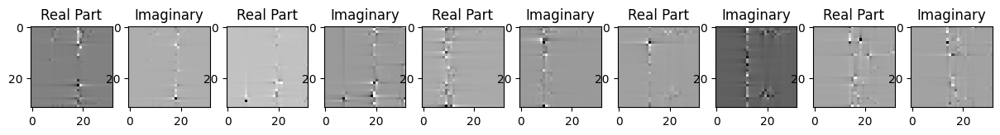

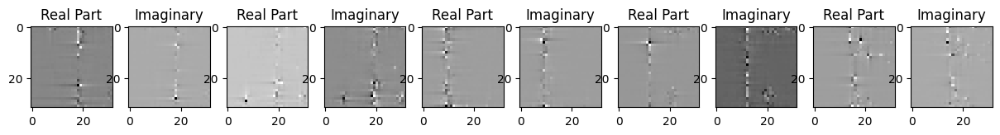

Epoch-86 lr: 0.001
Loss:  5.3216193919070065e-05
torch.Size([5, 2, 32, 32])


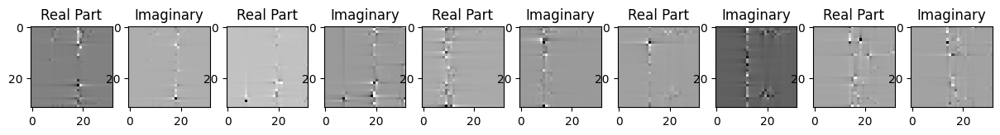

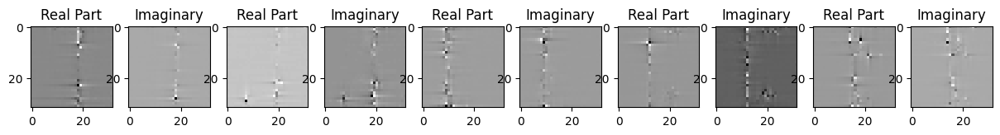

Epoch-87 lr: 0.001
Loss:  8.309642726089805e-05
torch.Size([5, 2, 32, 32])


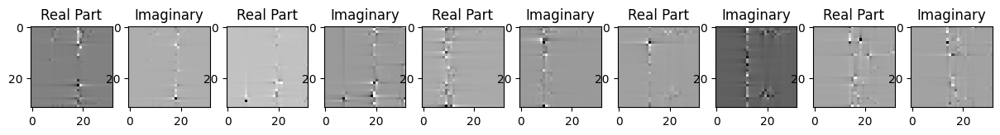

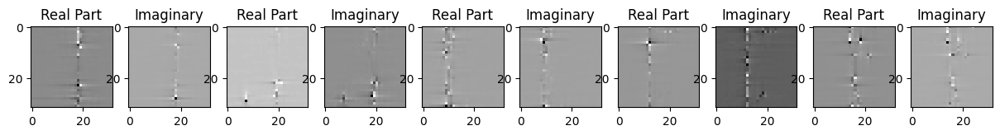

Epoch-88 lr: 0.001
Loss:  8.422690734732896e-05
torch.Size([5, 2, 32, 32])


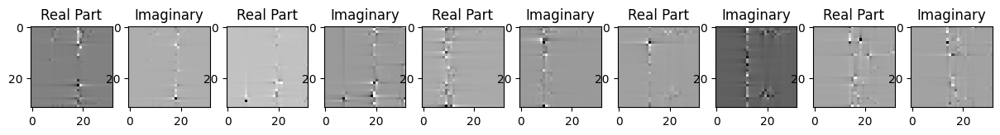

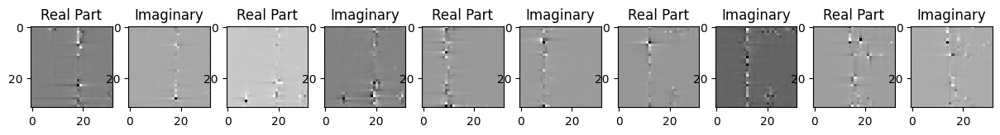

Epoch-89 lr: 0.001
Loss:  5.2435443649301305e-05
torch.Size([5, 2, 32, 32])


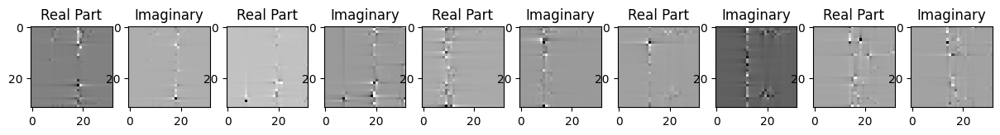

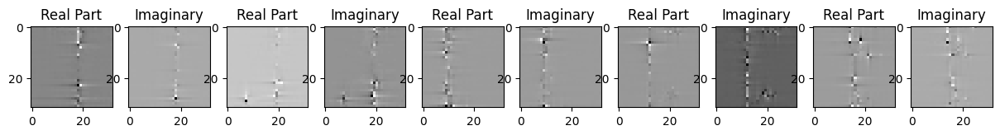

Epoch-90 lr: 0.001
Loss:  0.0002281056367792189
torch.Size([5, 2, 32, 32])


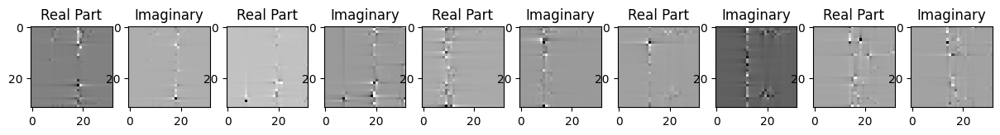

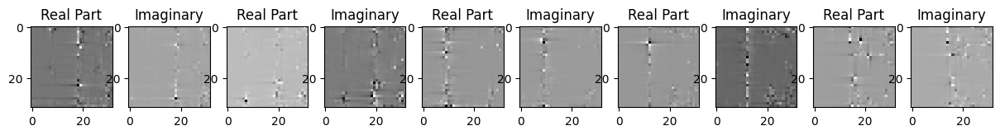

Epoch-91 lr: 0.001
Loss:  6.042335007805377e-05
torch.Size([5, 2, 32, 32])


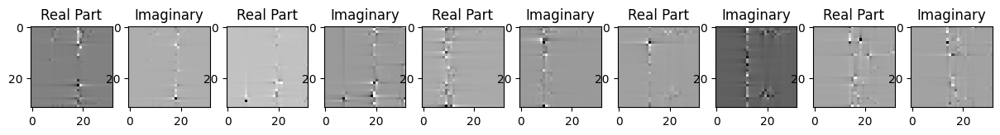

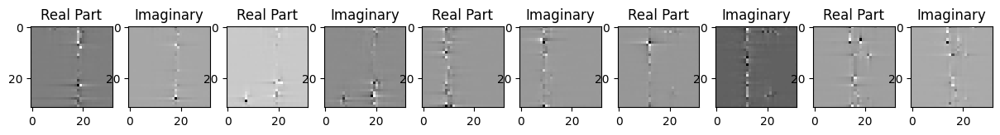

Epoch-92 lr: 0.001
Loss:  8.345110109075904e-05
torch.Size([5, 2, 32, 32])


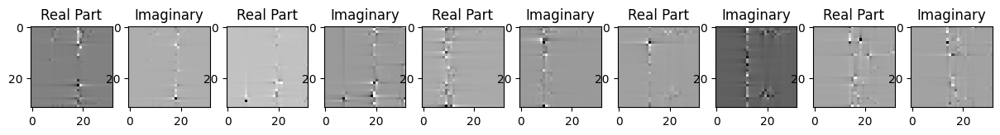

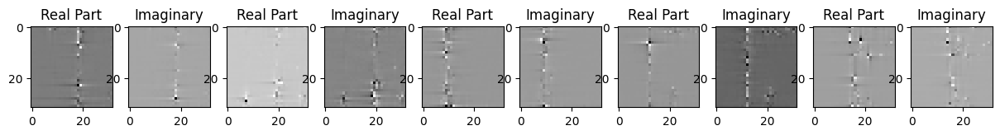

Epoch-93 lr: 0.001
Loss:  5.3844796639168635e-05
torch.Size([5, 2, 32, 32])


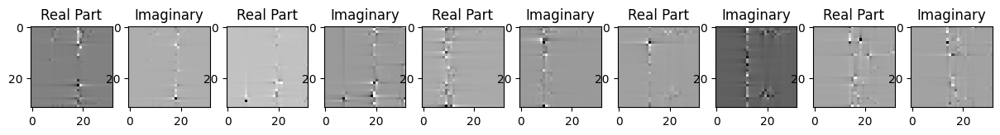

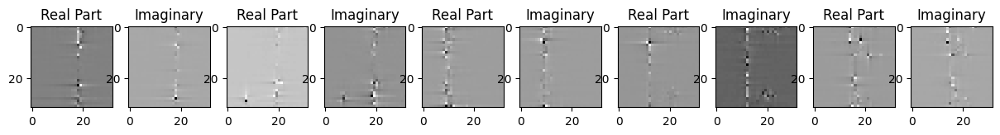

Epoch-94 lr: 0.001
Loss:  5.322764263837598e-05
torch.Size([5, 2, 32, 32])


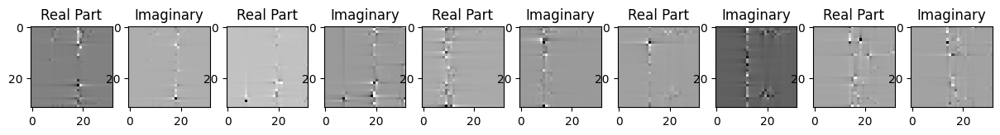

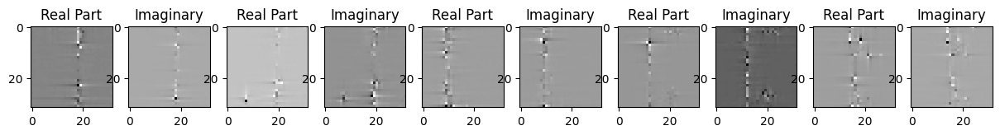

Epoch-95 lr: 0.001
Loss:  5.261560727376491e-05
torch.Size([5, 2, 32, 32])


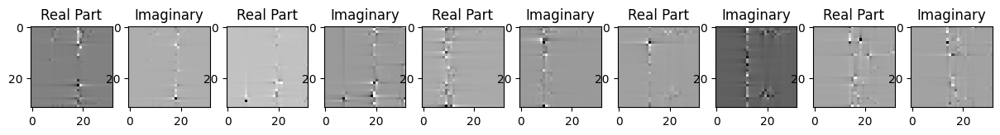

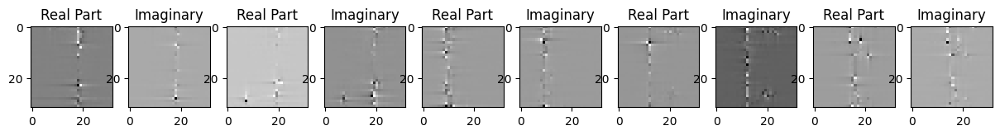

Epoch-96 lr: 0.001
Loss:  5.909309766138904e-05
torch.Size([5, 2, 32, 32])


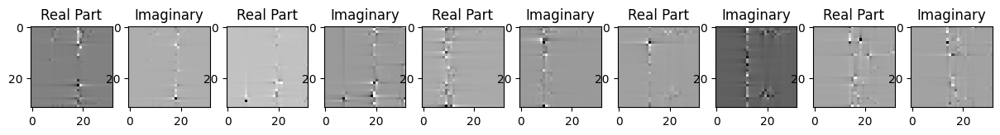

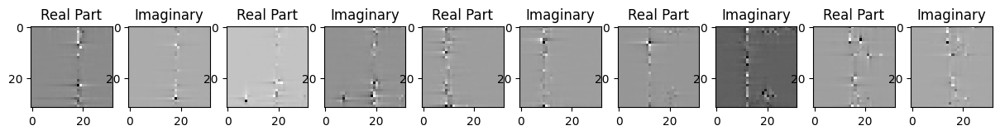

Epoch-97 lr: 0.001
Loss:  5.9999118093401194e-05
torch.Size([5, 2, 32, 32])


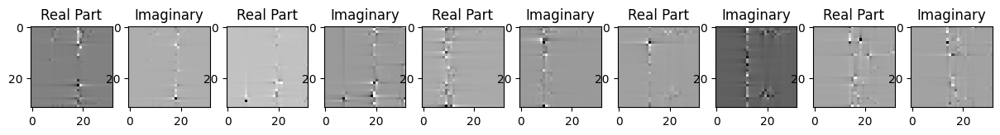

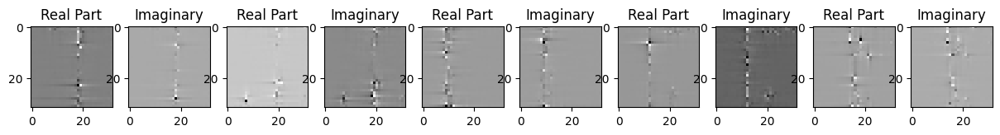

Epoch-98 lr: 0.001
Loss:  5.523475192603655e-05
torch.Size([5, 2, 32, 32])


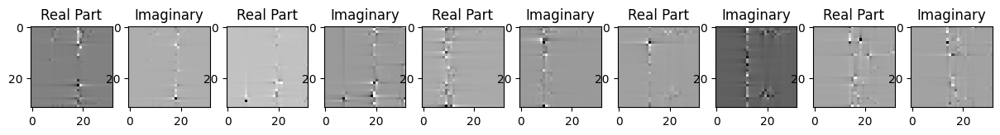

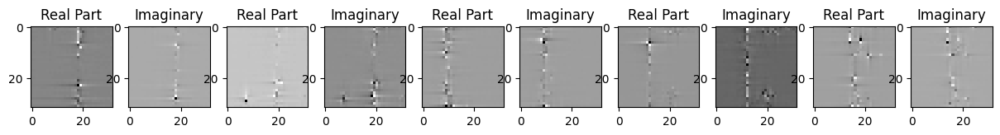

Epoch-99 lr: 0.001
Loss:  0.00010332736565032974
torch.Size([5, 2, 32, 32])


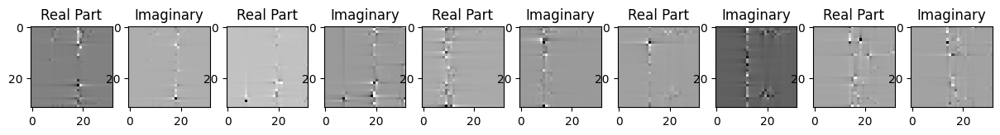

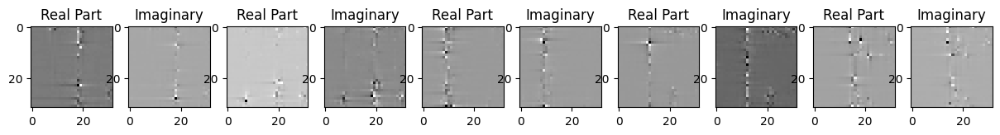

Epoch-100 lr: 0.001
Loss:  5.705966759705916e-05
torch.Size([5, 2, 32, 32])


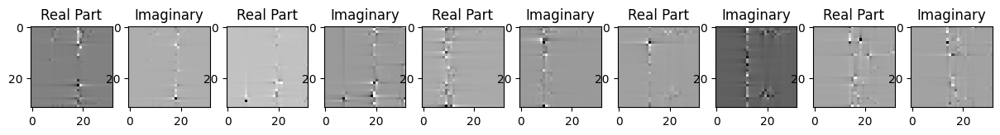

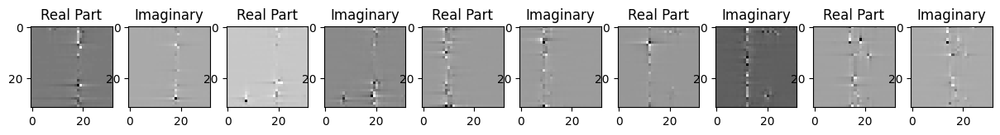

Epoch-101 lr: 0.0009000000000000001
Loss:  6.247546116355807e-05
torch.Size([5, 2, 32, 32])


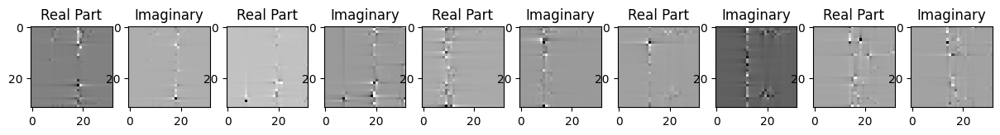

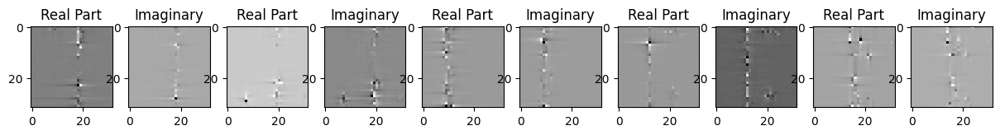

Saving model to: /content/drive/MyDrive/saved_model/_model_100_outdoor_512.pth
Epoch-102 lr: 0.0009000000000000001
Loss:  0.0003226099070161581
torch.Size([5, 2, 32, 32])


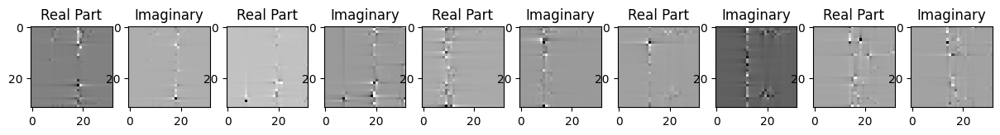

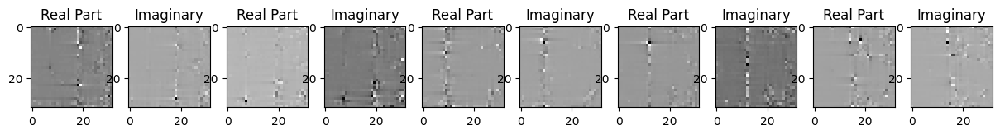

Epoch-103 lr: 0.0009000000000000001
Loss:  0.000636034645140171
torch.Size([5, 2, 32, 32])


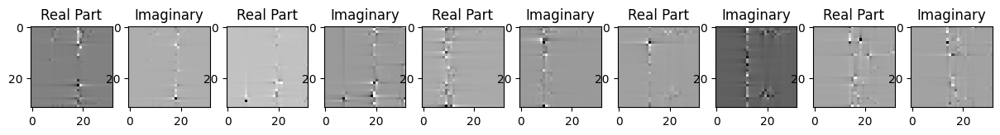

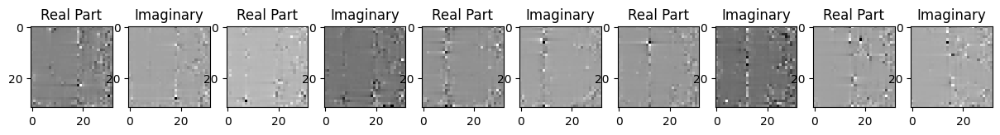

Epoch-104 lr: 0.0009000000000000001
Loss:  8.118651021504775e-05
torch.Size([5, 2, 32, 32])


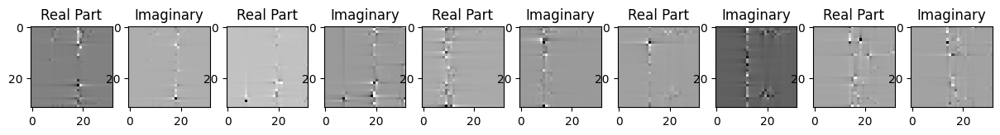

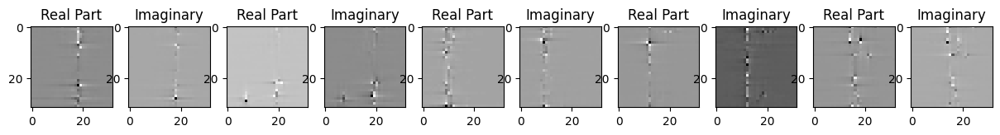

Epoch-105 lr: 0.0009000000000000001
Loss:  0.0001594631903572008
torch.Size([5, 2, 32, 32])


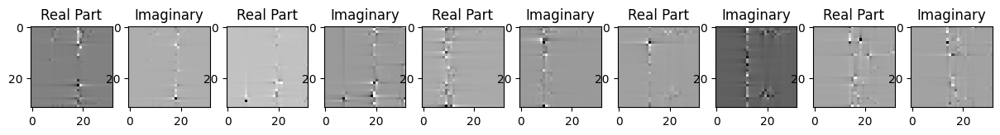

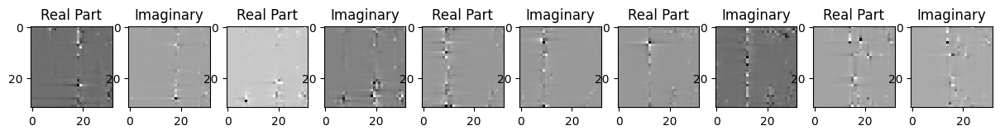

Epoch-106 lr: 0.0009000000000000001
Loss:  0.00015760883979965
torch.Size([5, 2, 32, 32])


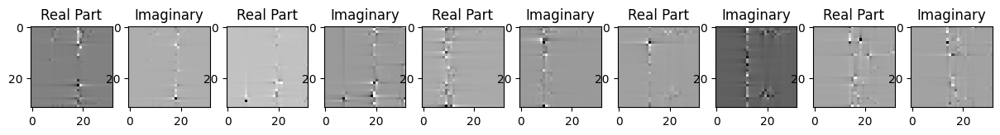

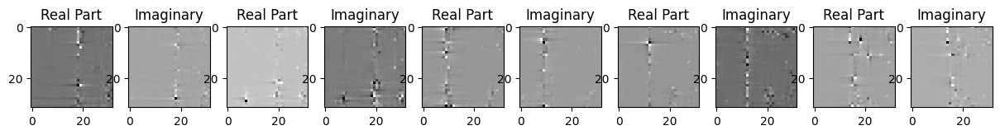

Epoch-107 lr: 0.0009000000000000001
Loss:  0.0001012800566968508
torch.Size([5, 2, 32, 32])


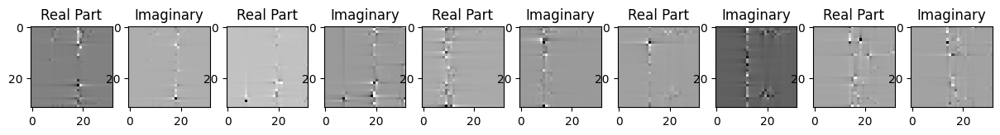

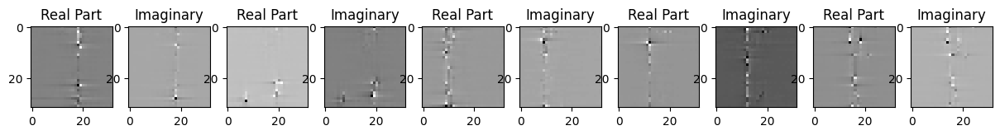

Epoch-108 lr: 0.0009000000000000001
Loss:  5.3120300435693935e-05
torch.Size([5, 2, 32, 32])


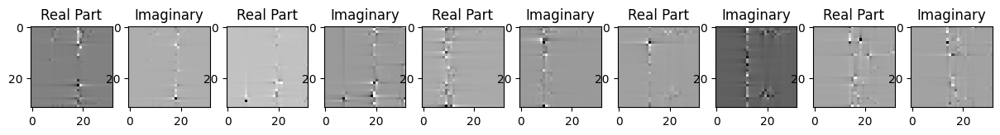

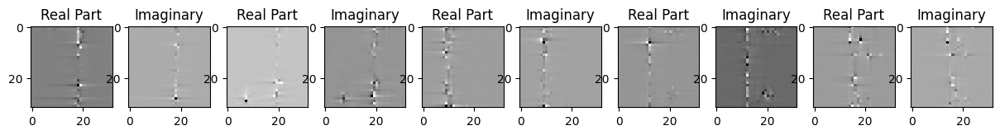

Epoch-109 lr: 0.0009000000000000001
Loss:  0.00014612480299547315
torch.Size([5, 2, 32, 32])


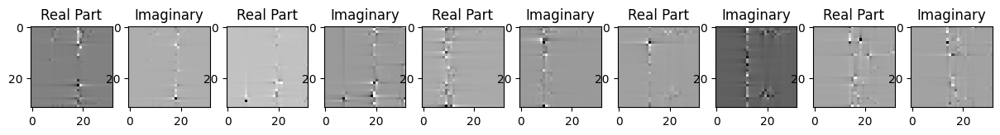

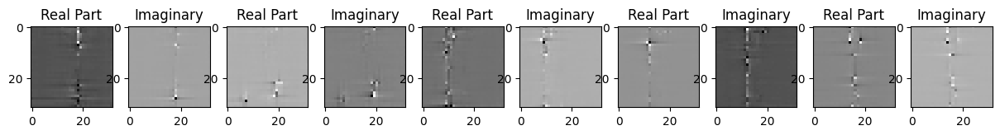

Epoch-110 lr: 0.0009000000000000001
Loss:  8.256902219727635e-05
torch.Size([5, 2, 32, 32])


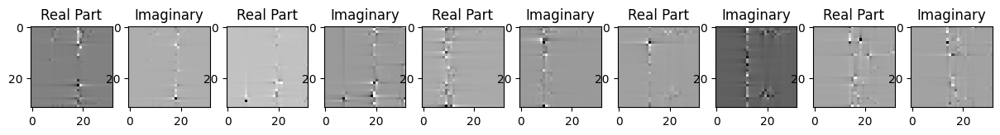

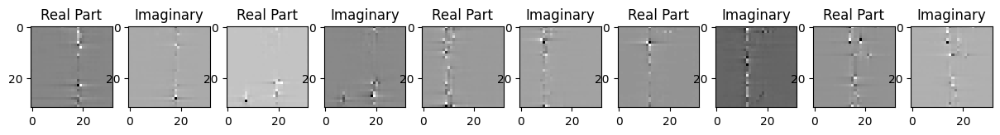

Epoch-111 lr: 0.0009000000000000001
Loss:  9.181684436043724e-05
torch.Size([5, 2, 32, 32])


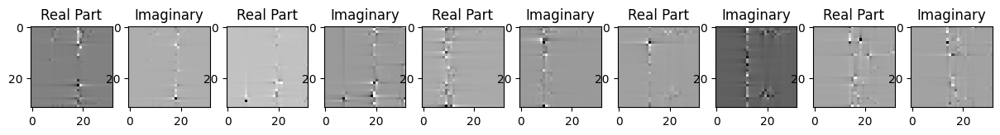

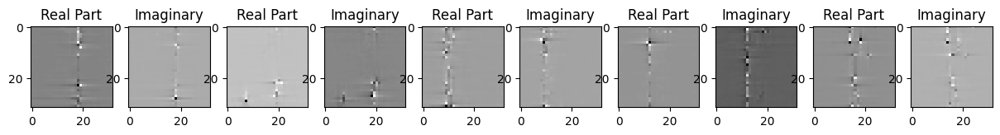

Epoch-112 lr: 0.0009000000000000001
Loss:  7.581333920825273e-05
torch.Size([5, 2, 32, 32])


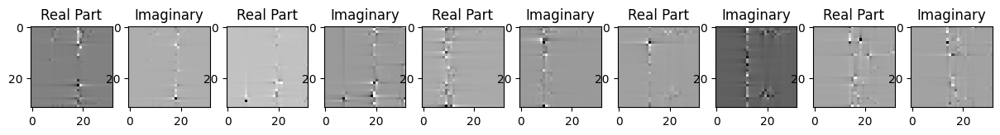

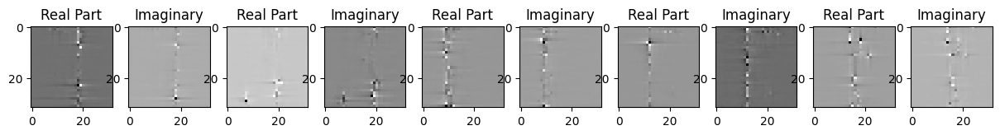

Epoch-113 lr: 0.0009000000000000001
Loss:  6.0358437622198835e-05
torch.Size([5, 2, 32, 32])


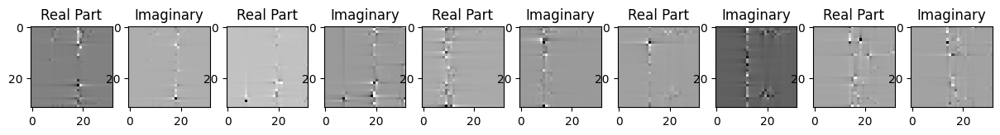

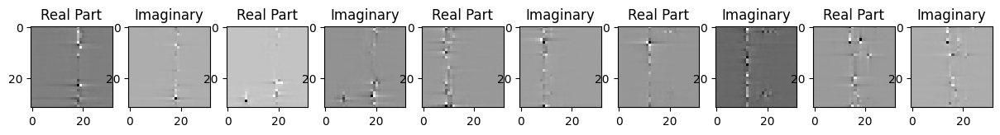

Epoch-114 lr: 0.0009000000000000001
Loss:  5.9493362641660497e-05
torch.Size([5, 2, 32, 32])


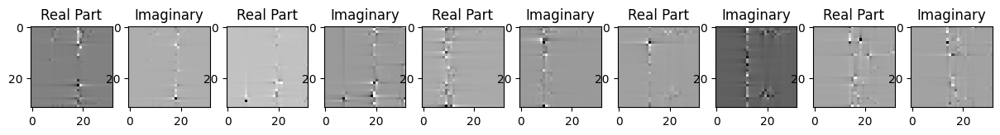

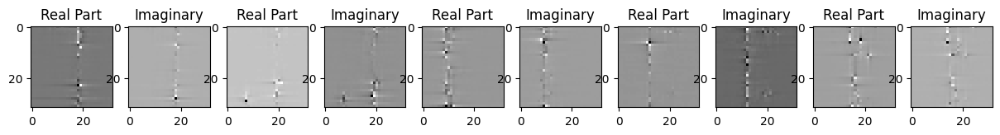

Epoch-115 lr: 0.0009000000000000001
Loss:  5.556949327001348e-05
torch.Size([5, 2, 32, 32])


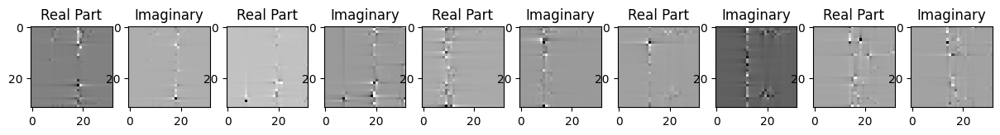

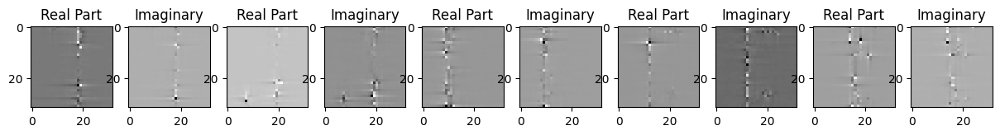

Epoch-116 lr: 0.0009000000000000001
Loss:  5.71304299228359e-05
torch.Size([5, 2, 32, 32])


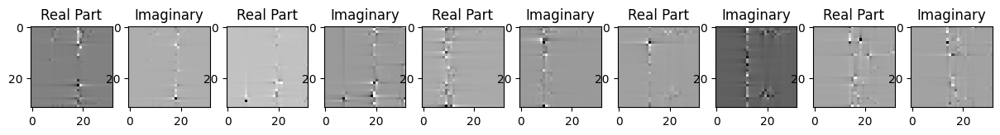

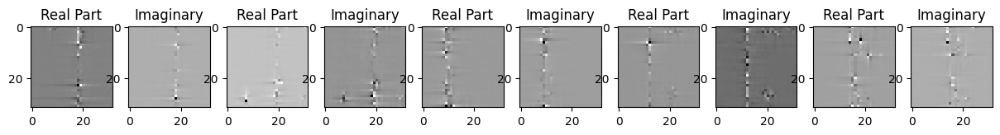

Epoch-117 lr: 0.0009000000000000001
Loss:  4.969061046722345e-05
torch.Size([5, 2, 32, 32])


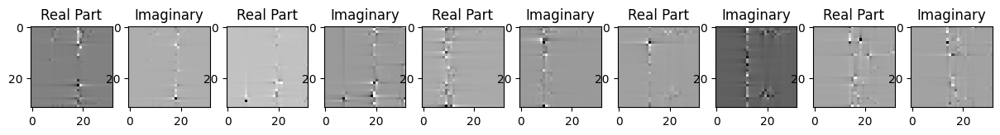

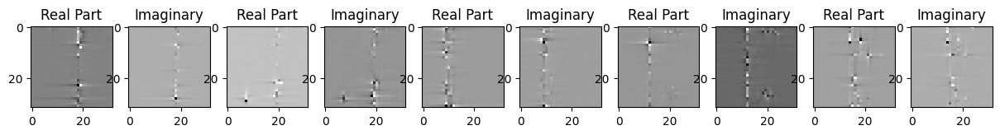

Epoch-118 lr: 0.0009000000000000001
Loss:  5.791165676782839e-05
torch.Size([5, 2, 32, 32])


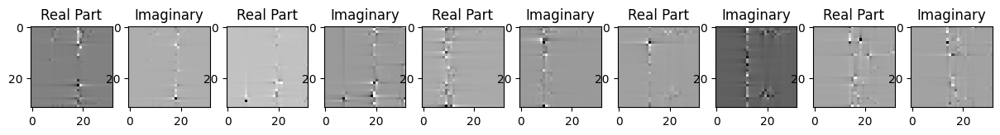

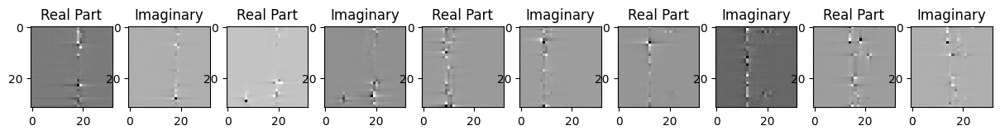

Epoch-119 lr: 0.0009000000000000001
Loss:  5.9352074458729476e-05
torch.Size([5, 2, 32, 32])


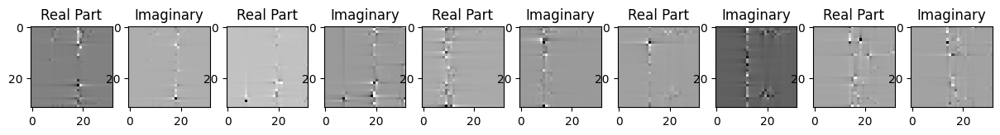

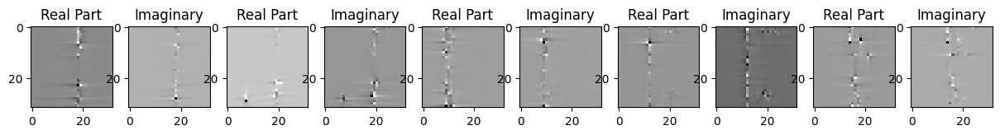

Epoch-120 lr: 0.0009000000000000001
Loss:  5.5102453188737854e-05
torch.Size([5, 2, 32, 32])


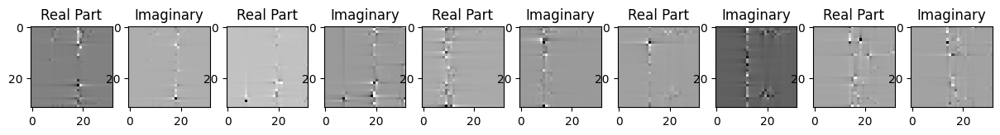

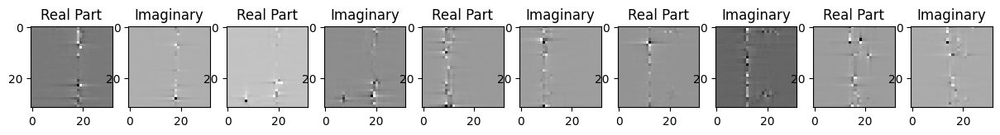

Epoch-121 lr: 0.0009000000000000001
Loss:  9.080656309379265e-05
torch.Size([5, 2, 32, 32])


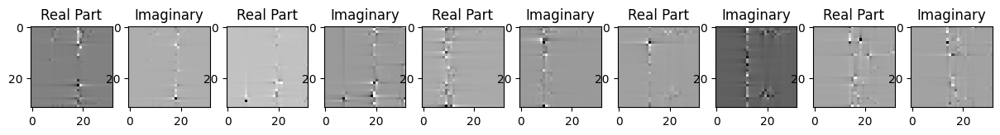

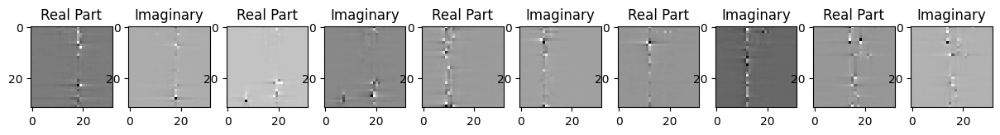

Epoch-122 lr: 0.0009000000000000001
Loss:  0.0001088318313122727
torch.Size([5, 2, 32, 32])


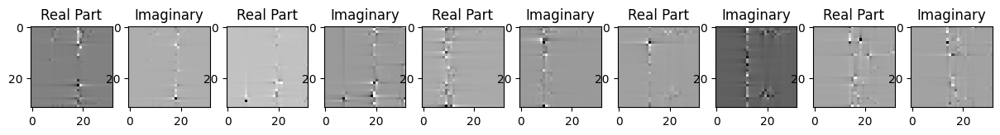

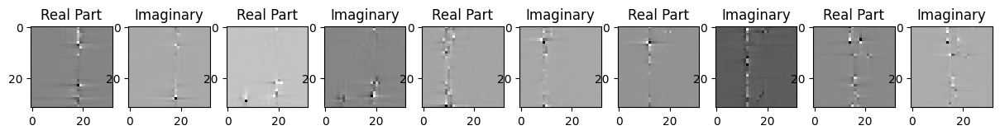

Epoch-123 lr: 0.0009000000000000001
Loss:  0.00022320372227113694
torch.Size([5, 2, 32, 32])


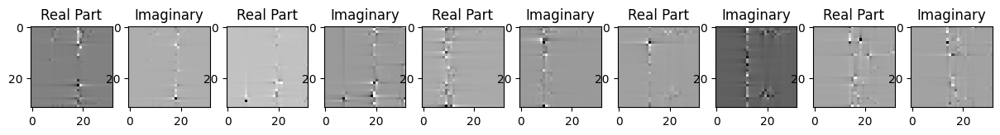

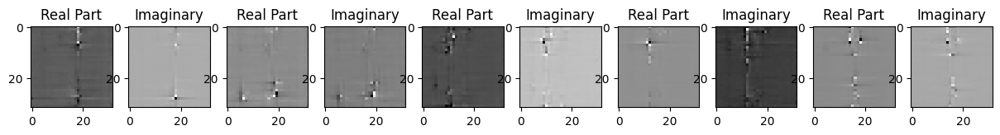

Epoch-124 lr: 0.0009000000000000001
Loss:  5.279588731355034e-05
torch.Size([5, 2, 32, 32])


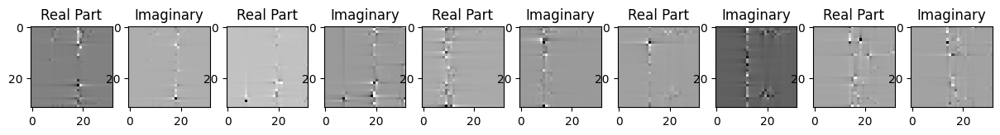

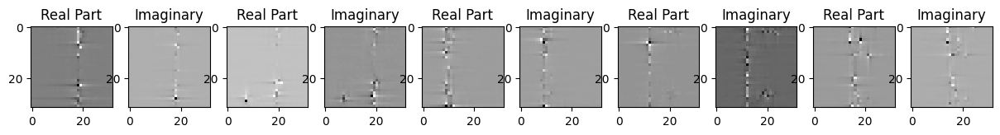

Epoch-125 lr: 0.0009000000000000001
Loss:  0.00011157892731716856
torch.Size([5, 2, 32, 32])


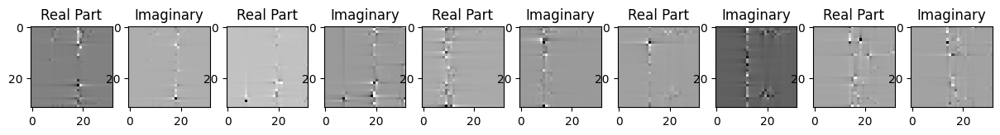

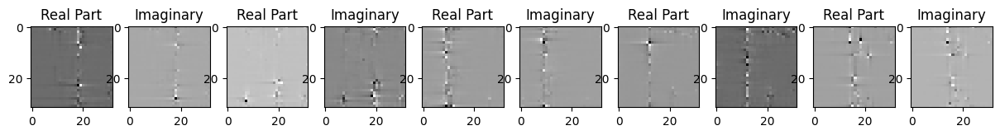

Epoch-126 lr: 0.0009000000000000001
Loss:  8.960187551565468e-05
torch.Size([5, 2, 32, 32])


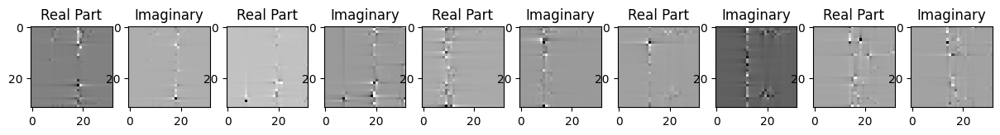

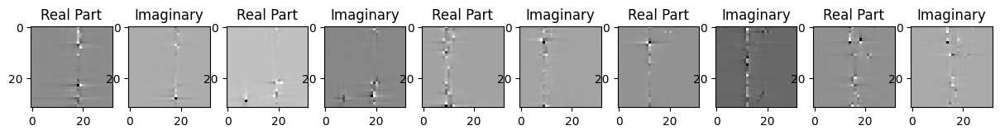

Epoch-127 lr: 0.0009000000000000001
Loss:  0.00019888045790139586
torch.Size([5, 2, 32, 32])


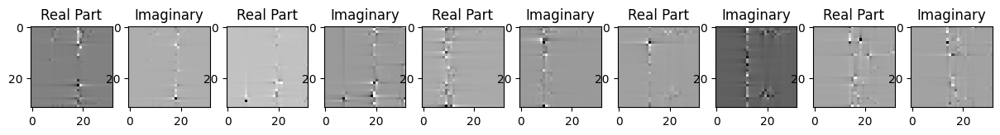

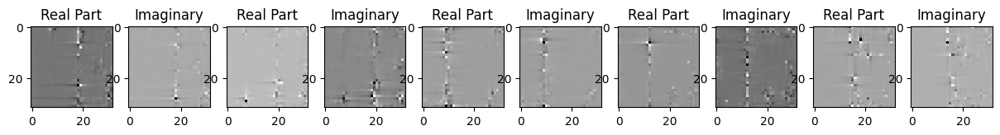

Epoch-128 lr: 0.0009000000000000001
Loss:  7.551154703833163e-05
torch.Size([5, 2, 32, 32])


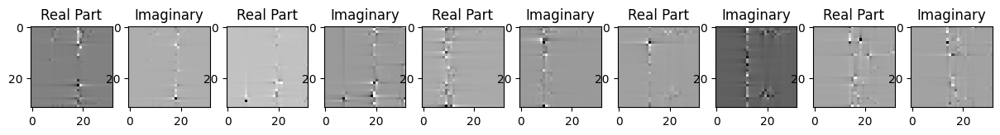

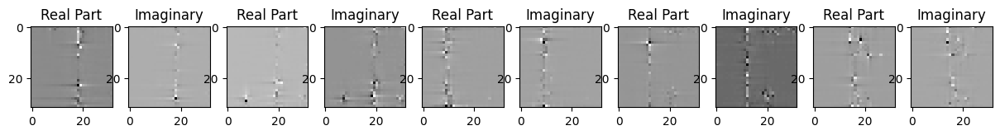

Epoch-129 lr: 0.0009000000000000001
Loss:  0.00011998278932878748
torch.Size([5, 2, 32, 32])


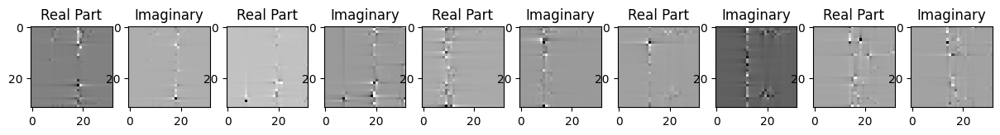

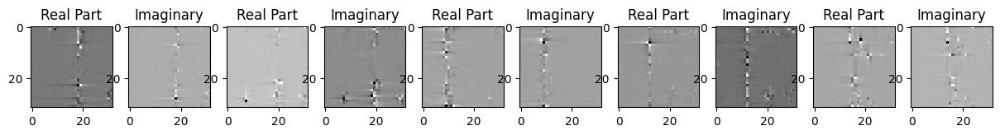

Epoch-130 lr: 0.0009000000000000001
Loss:  6.852118531242013e-05
torch.Size([5, 2, 32, 32])


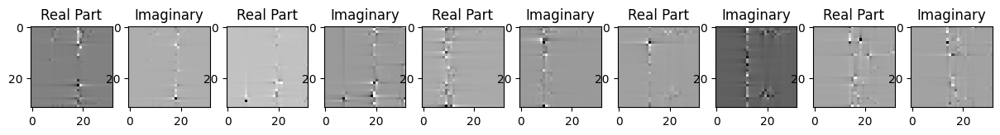

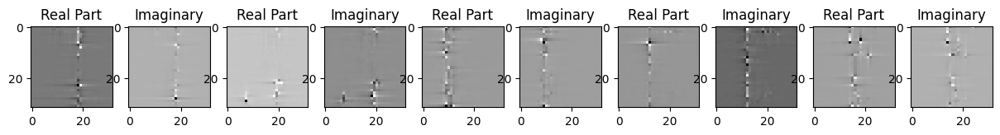

Epoch-131 lr: 0.0009000000000000001
Loss:  0.0001932259910972789
torch.Size([5, 2, 32, 32])


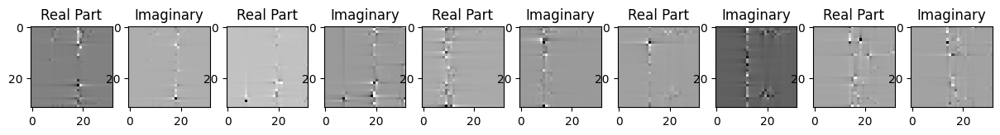

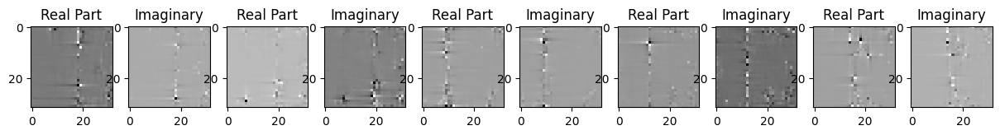

Epoch-132 lr: 0.0009000000000000001
Loss:  0.00026646789046935737
torch.Size([5, 2, 32, 32])


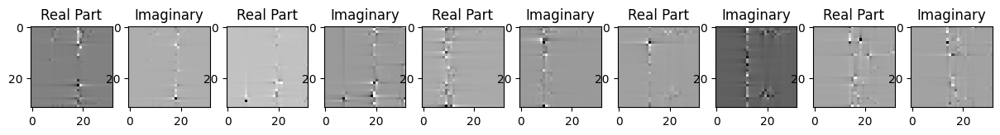

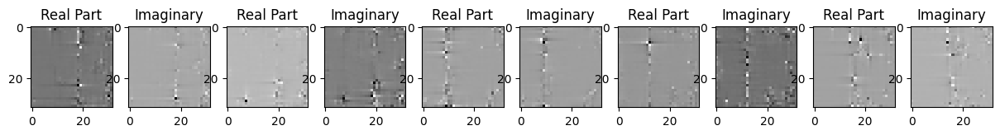

Epoch-133 lr: 0.0009000000000000001
Loss:  5.3019088227301836e-05
torch.Size([5, 2, 32, 32])


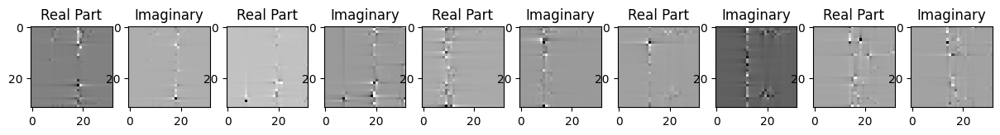

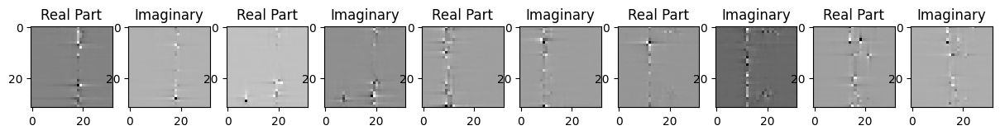

Epoch-134 lr: 0.0009000000000000001
Loss:  5.581568257184699e-05
torch.Size([5, 2, 32, 32])


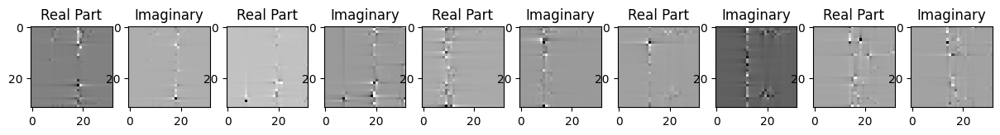

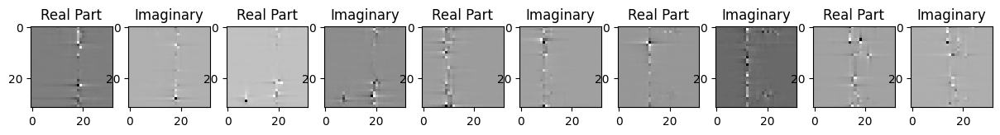

Epoch-135 lr: 0.0009000000000000001
Loss:  6.36390395811759e-05
torch.Size([5, 2, 32, 32])


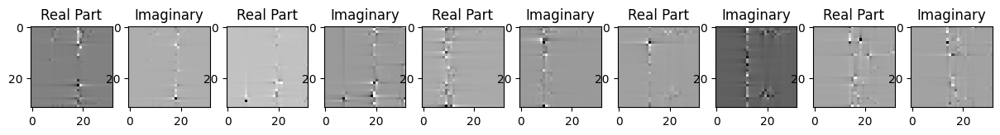

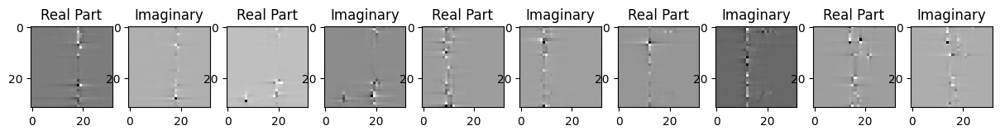

Epoch-136 lr: 0.0009000000000000001
Loss:  5.783991582575254e-05
torch.Size([5, 2, 32, 32])


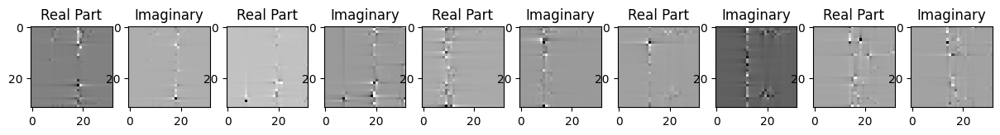

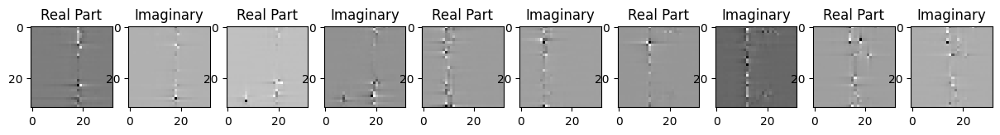

Epoch-137 lr: 0.0009000000000000001
Loss:  8.068699389696121e-05
torch.Size([5, 2, 32, 32])


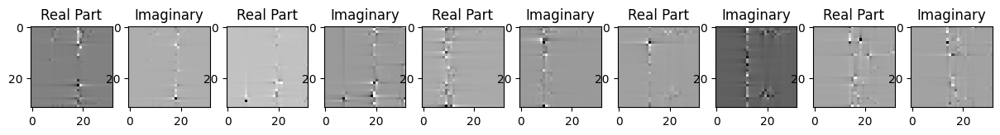

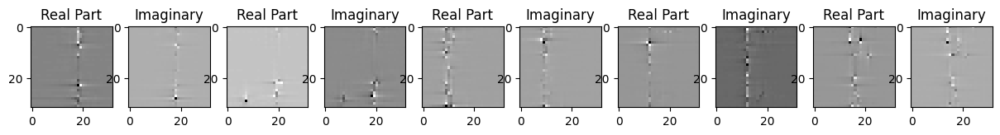

Epoch-138 lr: 0.0009000000000000001
Loss:  5.9200065152253956e-05
torch.Size([5, 2, 32, 32])


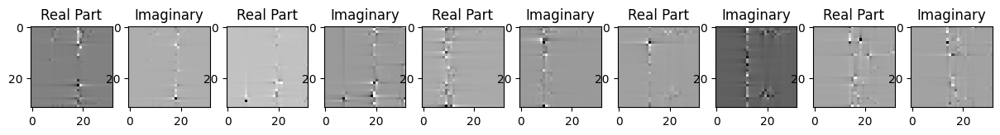

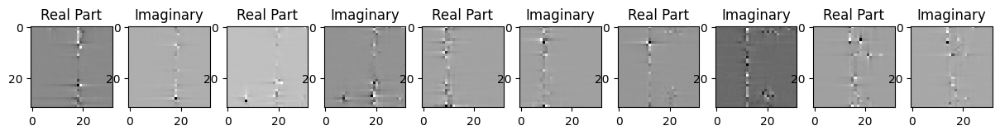

Epoch-139 lr: 0.0009000000000000001
Loss:  4.825999349122867e-05
torch.Size([5, 2, 32, 32])


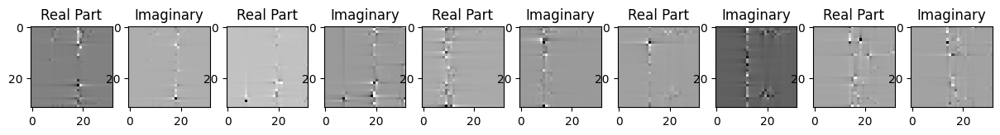

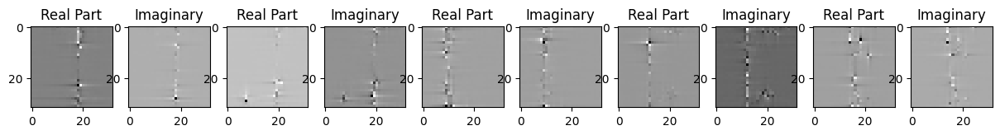

Epoch-140 lr: 0.0009000000000000001
Loss:  6.14896125625819e-05
torch.Size([5, 2, 32, 32])


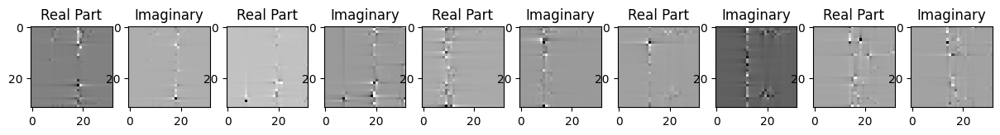

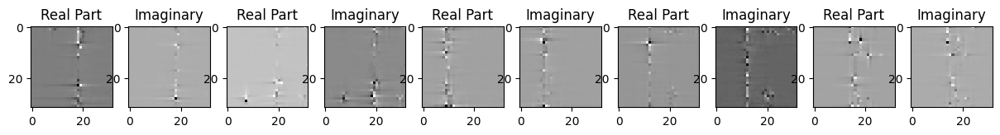

Epoch-141 lr: 0.0009000000000000001
Loss:  0.0003856176626868546
torch.Size([5, 2, 32, 32])


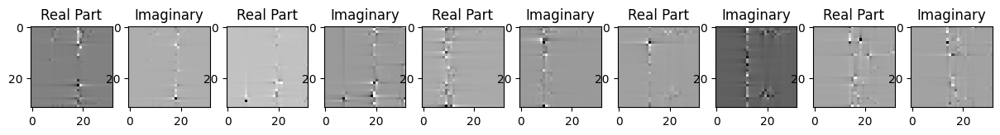

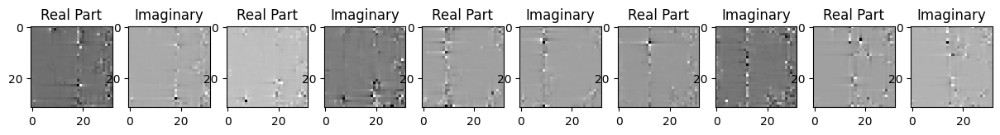

Epoch-142 lr: 0.0009000000000000001
Loss:  4.885908856522292e-05
torch.Size([5, 2, 32, 32])


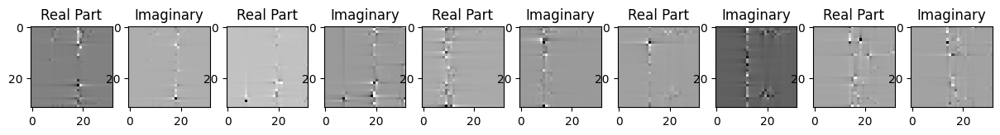

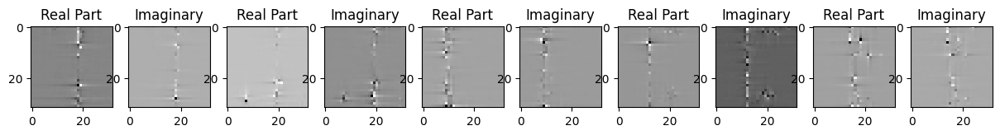

Epoch-143 lr: 0.0009000000000000001
Loss:  0.00042855174979195
torch.Size([5, 2, 32, 32])


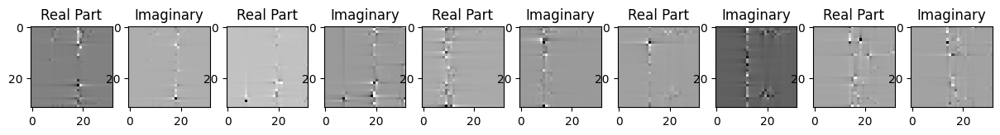

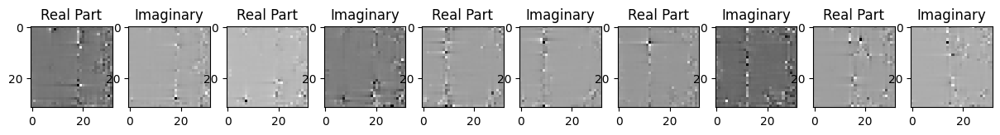

Epoch-144 lr: 0.0009000000000000001
Loss:  5.993367813061923e-05
torch.Size([5, 2, 32, 32])


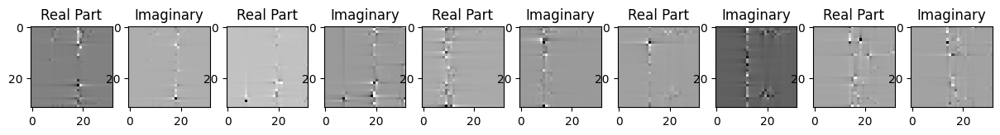

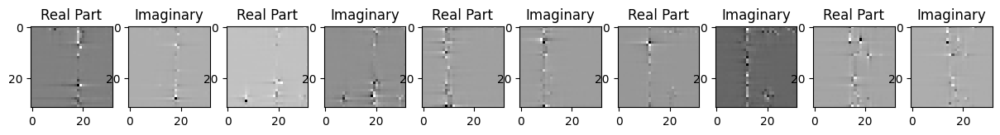

Epoch-145 lr: 0.0009000000000000001
Loss:  5.014927955926396e-05
torch.Size([5, 2, 32, 32])


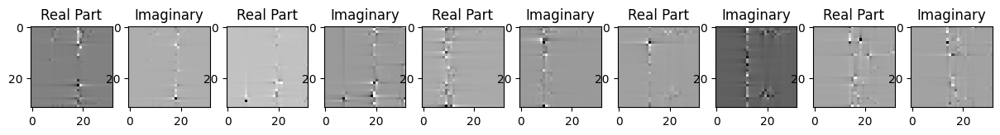

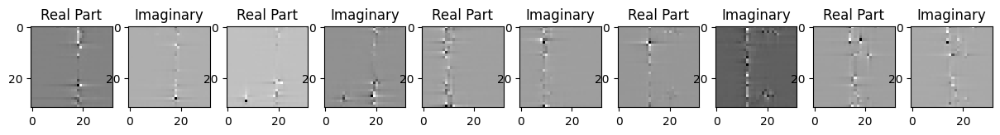

Epoch-146 lr: 0.0009000000000000001
Loss:  5.9311532822903246e-05
torch.Size([5, 2, 32, 32])


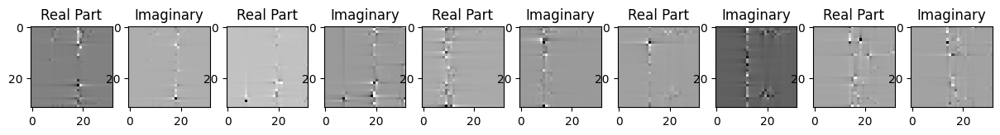

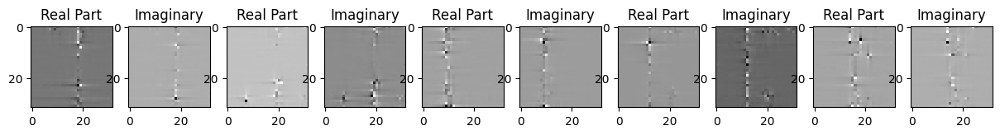

Epoch-147 lr: 0.0009000000000000001
Loss:  9.897787822410464e-05
torch.Size([5, 2, 32, 32])


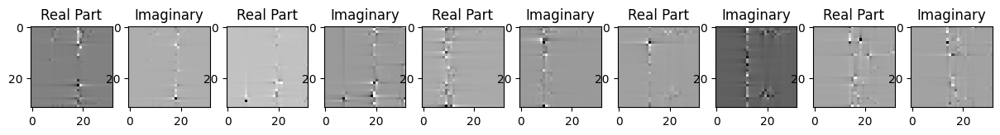

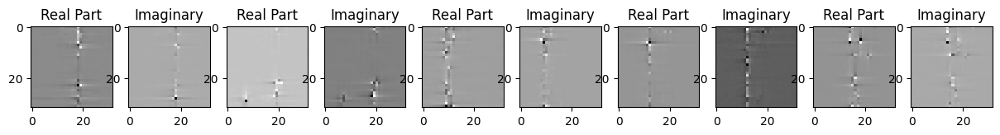

Epoch-148 lr: 0.0009000000000000001
Loss:  0.00010480427590664476
torch.Size([5, 2, 32, 32])


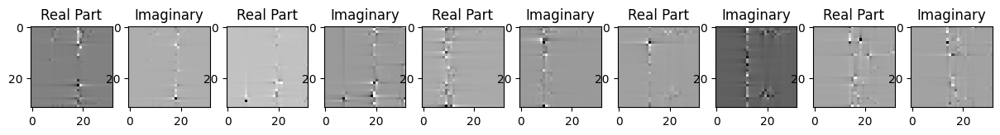

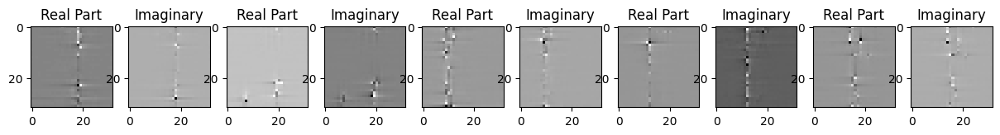

Epoch-149 lr: 0.0009000000000000001
Loss:  5.578530908678658e-05
torch.Size([5, 2, 32, 32])


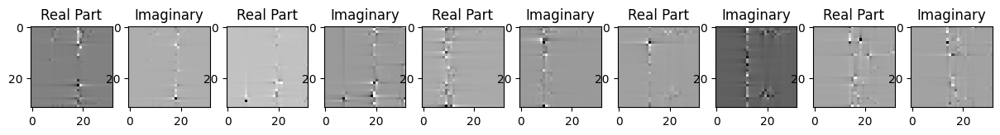

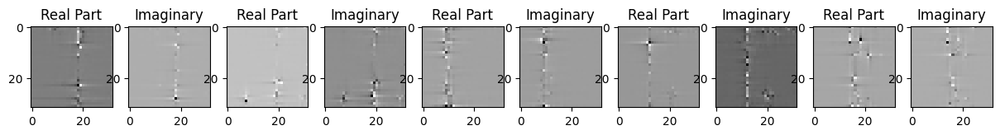

Epoch-150 lr: 0.0009000000000000001
Loss:  5.667299046763219e-05
torch.Size([5, 2, 32, 32])


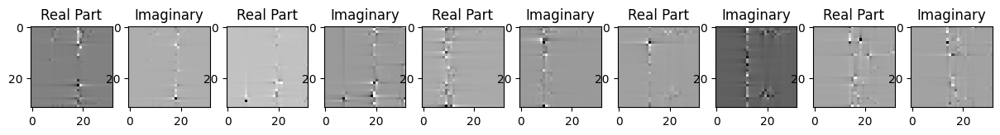

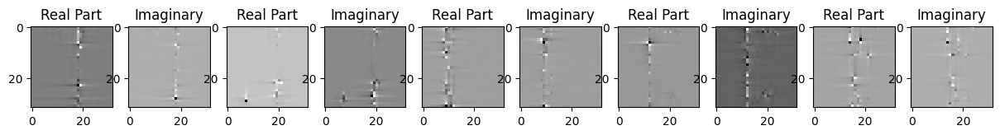

Epoch-151 lr: 0.0009000000000000001
Loss:  6.646051042480394e-05
torch.Size([5, 2, 32, 32])


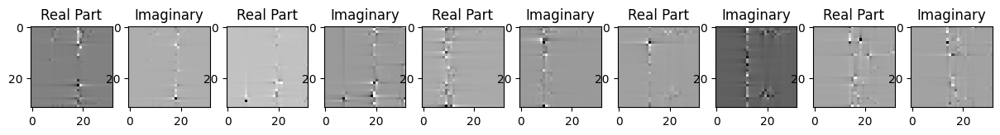

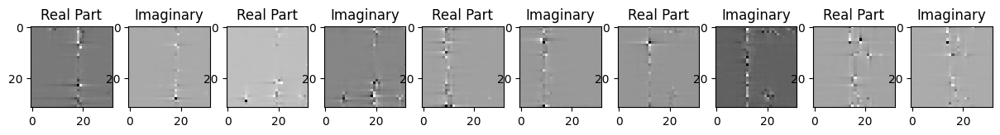

Saving model to: /content/drive/MyDrive/saved_model/_model_150_outdoor_512.pth
Epoch-152 lr: 0.0009000000000000001
Loss:  6.663392559858039e-05
torch.Size([5, 2, 32, 32])


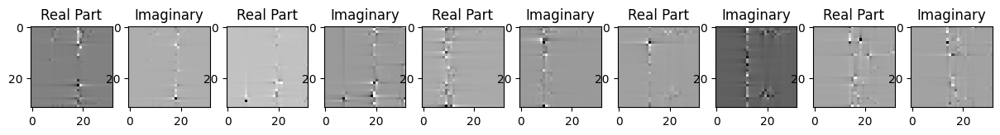

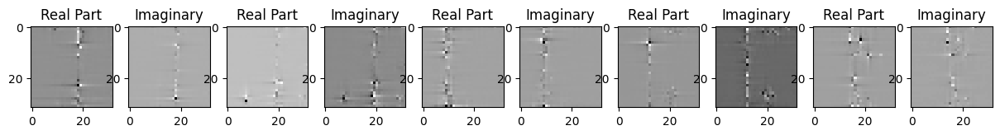

Epoch-153 lr: 0.0009000000000000001
Loss:  0.00015576192527078092
torch.Size([5, 2, 32, 32])


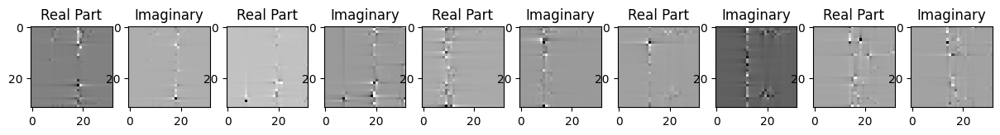

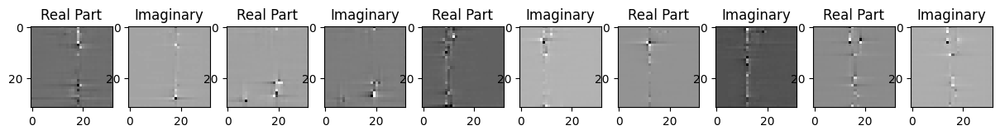

Epoch-154 lr: 0.0009000000000000001
Loss:  8.876698120729998e-05
torch.Size([5, 2, 32, 32])


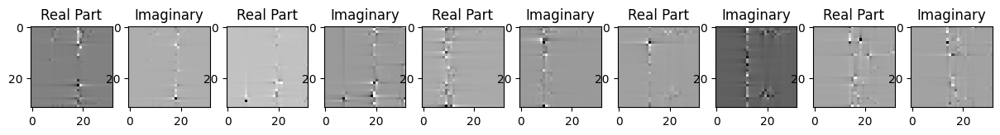

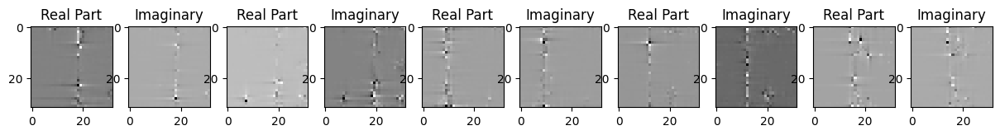

Epoch-155 lr: 0.0009000000000000001
Loss:  8.361490472452715e-05
torch.Size([5, 2, 32, 32])


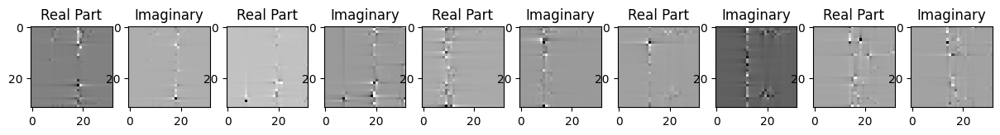

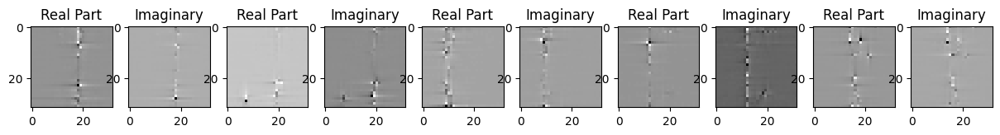

Epoch-156 lr: 0.0009000000000000001
Loss:  7.672520587220788e-05
torch.Size([5, 2, 32, 32])


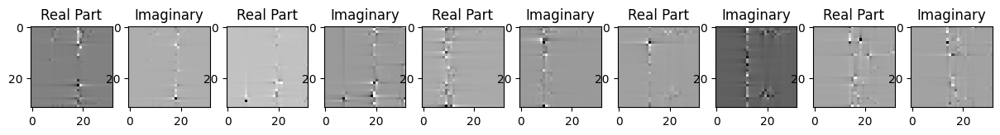

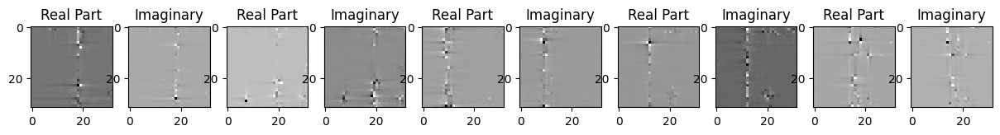

Epoch-157 lr: 0.0009000000000000001
Loss:  4.7506993723800406e-05
torch.Size([5, 2, 32, 32])


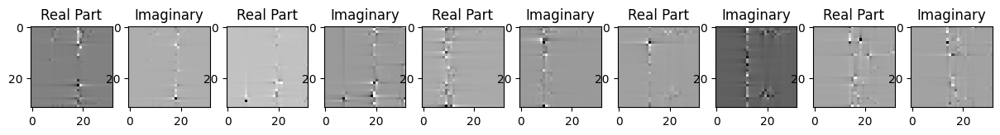

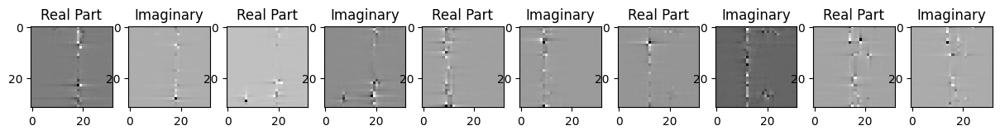

Epoch-158 lr: 0.0009000000000000001
Loss:  5.8016037655761465e-05
torch.Size([5, 2, 32, 32])


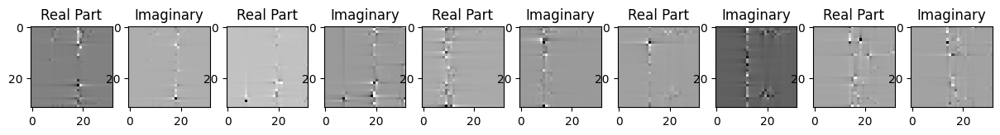

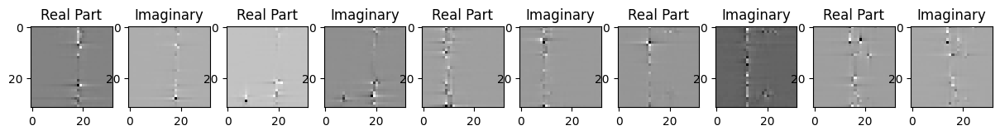

Epoch-159 lr: 0.0009000000000000001
Loss:  6.686386768706143e-05
torch.Size([5, 2, 32, 32])


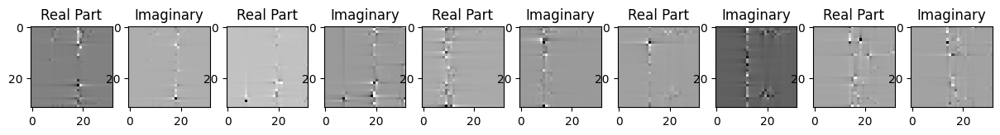

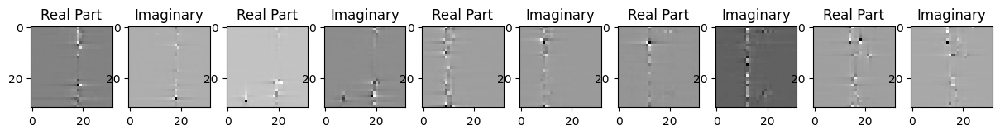

Epoch-160 lr: 0.0009000000000000001
Loss:  6.30564900347963e-05
torch.Size([5, 2, 32, 32])


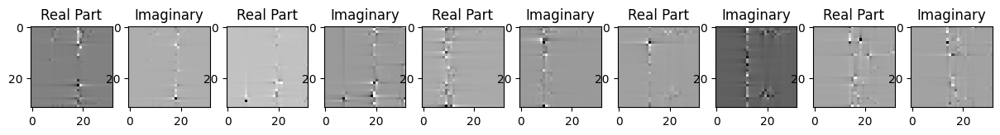

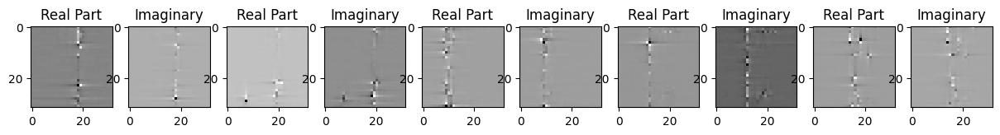

Epoch-161 lr: 0.0009000000000000001
Loss:  0.0001750924566294998
torch.Size([5, 2, 32, 32])


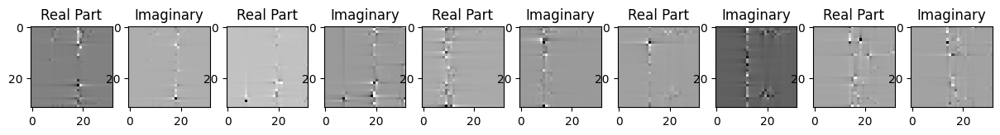

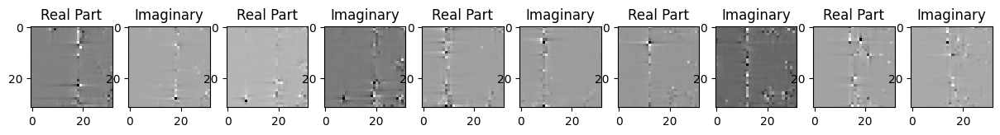

Epoch-162 lr: 0.0009000000000000001
Loss:  0.00011418022768339142
torch.Size([5, 2, 32, 32])


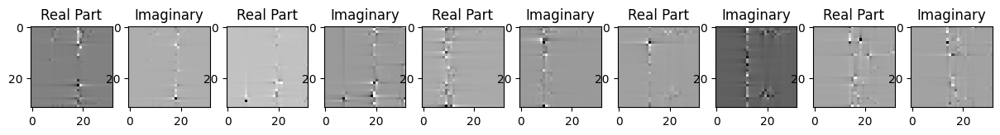

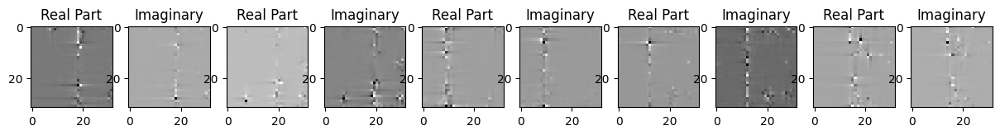

Epoch-163 lr: 0.0009000000000000001
Loss:  5.562025762628764e-05
torch.Size([5, 2, 32, 32])


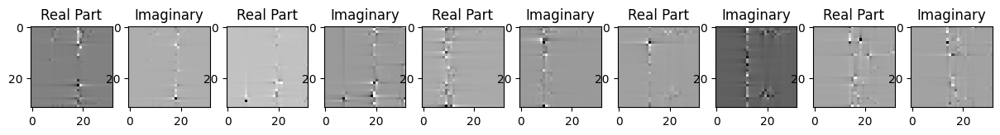

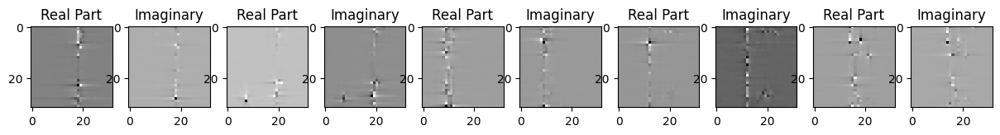

Epoch-164 lr: 0.0009000000000000001
Loss:  9.253291500499472e-05
torch.Size([5, 2, 32, 32])


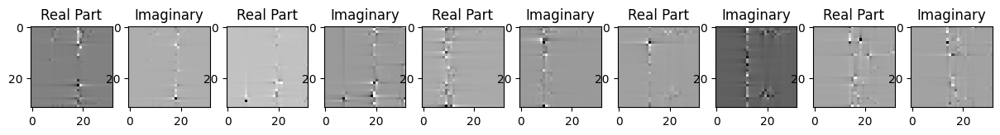

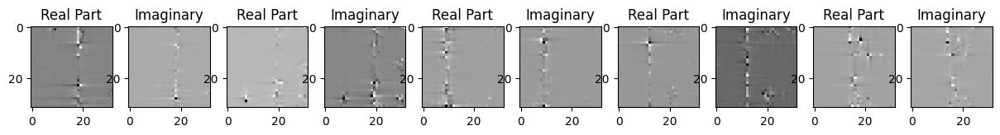

Epoch-165 lr: 0.0009000000000000001
Loss:  7.748606003588066e-05
torch.Size([5, 2, 32, 32])


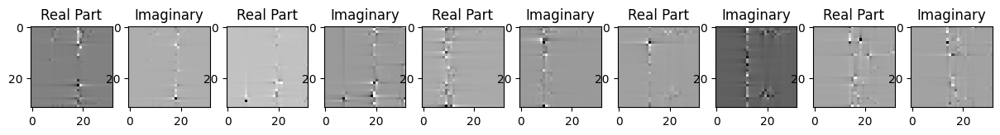

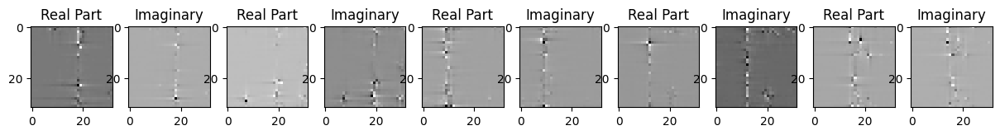

Epoch-166 lr: 0.0009000000000000001
Loss:  9.858265548245981e-05
torch.Size([5, 2, 32, 32])


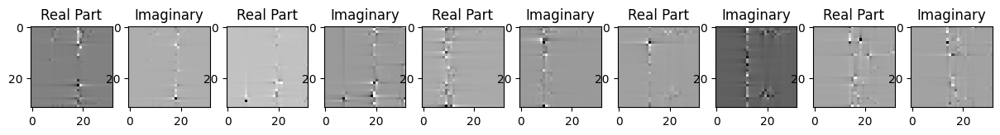

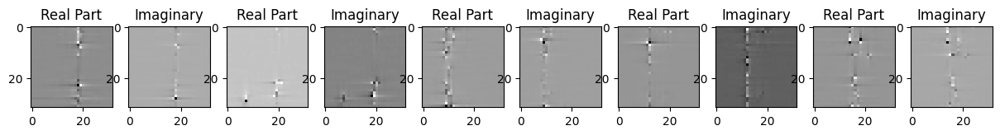

Epoch-167 lr: 0.0009000000000000001
Loss:  9.535108256386593e-05
torch.Size([5, 2, 32, 32])


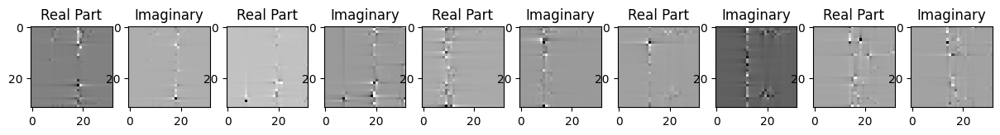

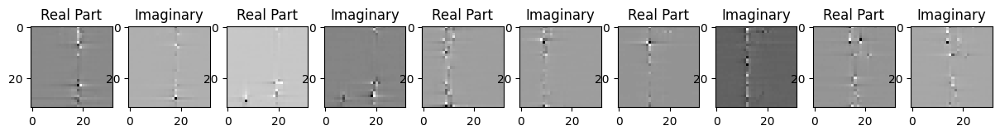

Epoch-168 lr: 0.0009000000000000001
Loss:  0.00016248741303570569
torch.Size([5, 2, 32, 32])


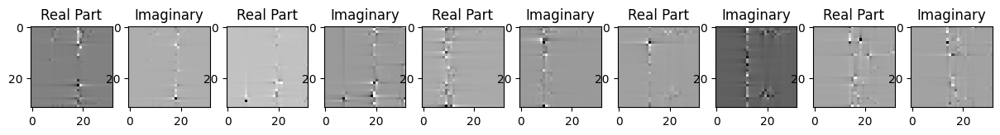

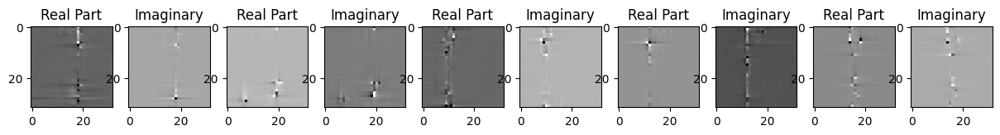

Epoch-169 lr: 0.0009000000000000001
Loss:  0.00022128228738438338
torch.Size([5, 2, 32, 32])


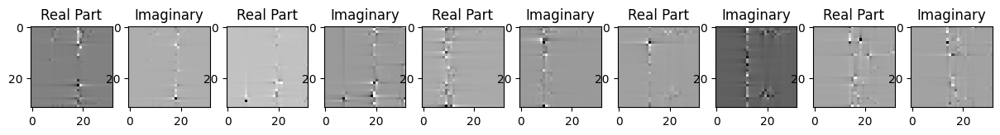

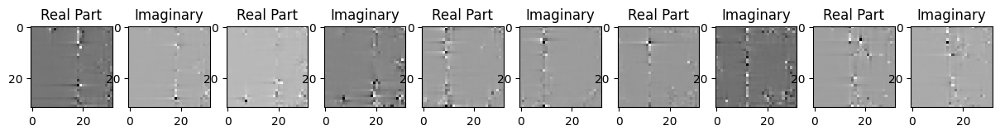

Epoch-170 lr: 0.0009000000000000001
Loss:  5.885664722882211e-05
torch.Size([5, 2, 32, 32])


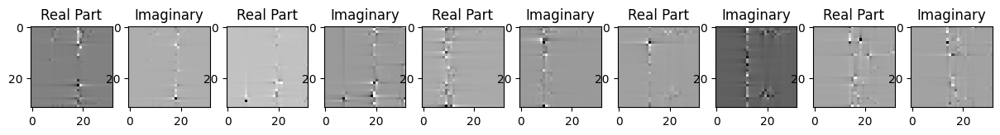

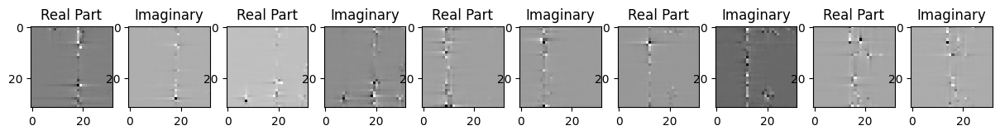

Epoch-171 lr: 0.0009000000000000001
Loss:  4.717586489277892e-05
torch.Size([5, 2, 32, 32])


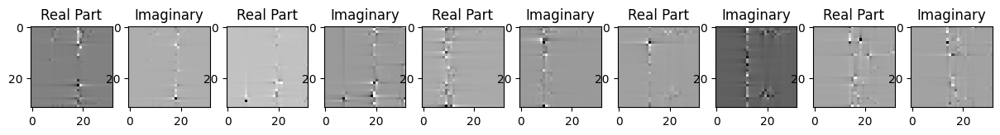

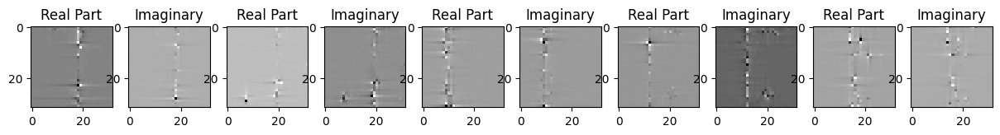

Epoch-172 lr: 0.0009000000000000001
Loss:  8.418720972258598e-05
torch.Size([5, 2, 32, 32])


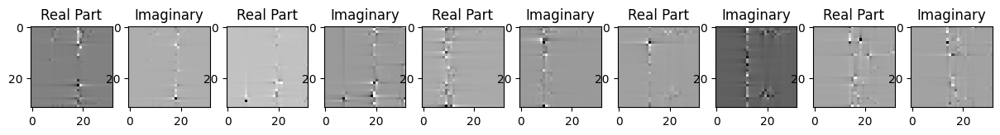

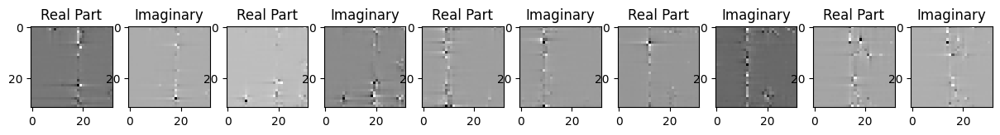

Epoch-173 lr: 0.0009000000000000001
Loss:  8.244384662248194e-05
torch.Size([5, 2, 32, 32])


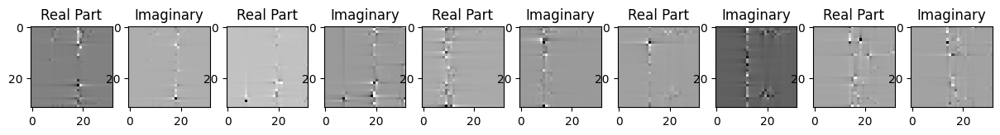

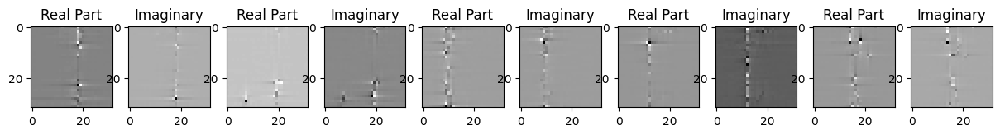

Epoch-174 lr: 0.0009000000000000001
Loss:  5.608999708783813e-05
torch.Size([5, 2, 32, 32])


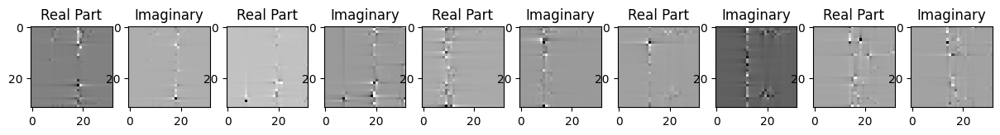

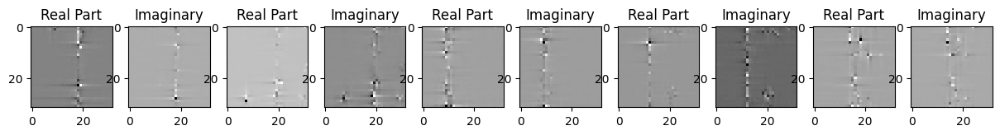

Epoch-175 lr: 0.0009000000000000001
Loss:  0.0001219639161718078
torch.Size([5, 2, 32, 32])


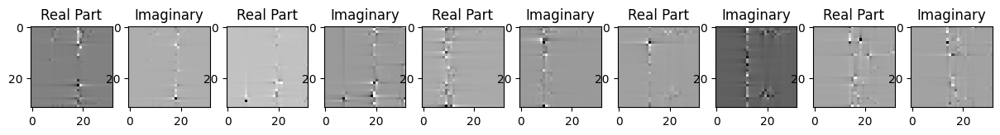

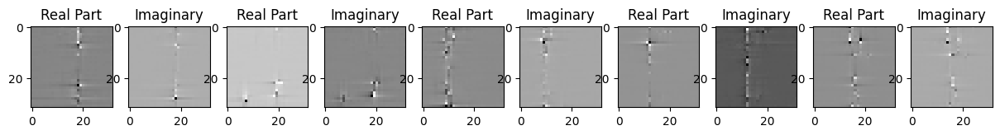

Epoch-176 lr: 0.0009000000000000001
Loss:  8.053536294028163e-05
torch.Size([5, 2, 32, 32])


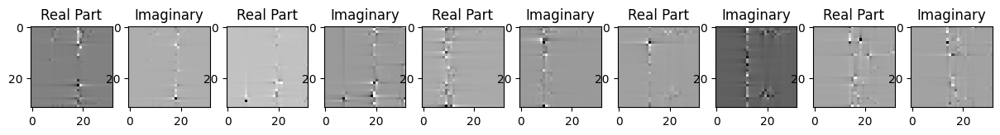

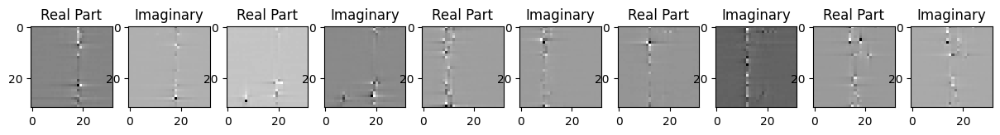

Epoch-177 lr: 0.0009000000000000001
Loss:  5.309299740474671e-05
torch.Size([5, 2, 32, 32])


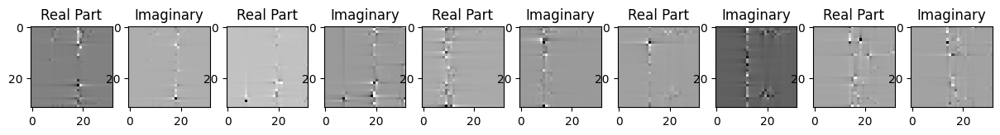

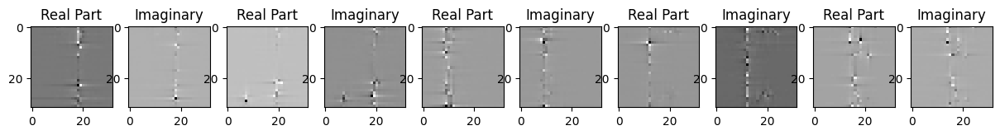

Epoch-178 lr: 0.0009000000000000001
Loss:  0.00012053198588546365
torch.Size([5, 2, 32, 32])


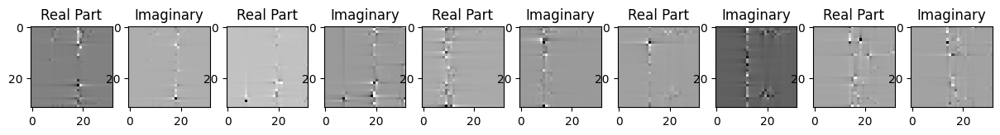

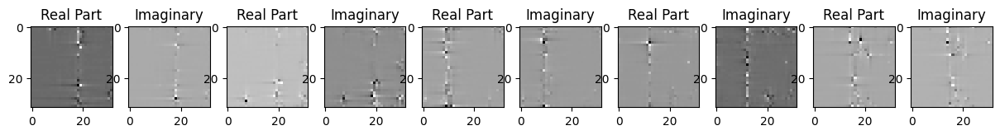

Epoch-179 lr: 0.0009000000000000001
Loss:  4.6807352191535756e-05
torch.Size([5, 2, 32, 32])


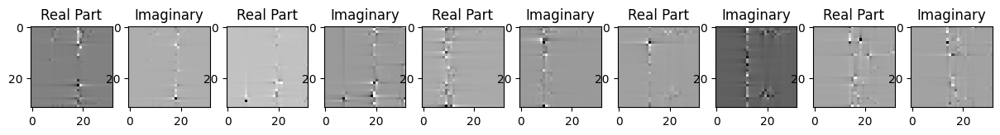

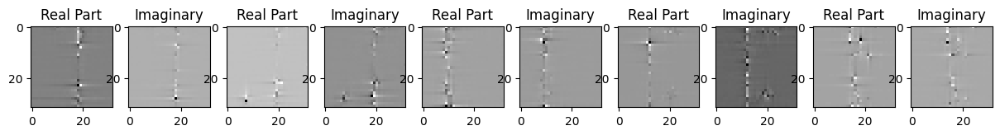

Epoch-180 lr: 0.0009000000000000001
Loss:  5.489899558597244e-05
torch.Size([5, 2, 32, 32])


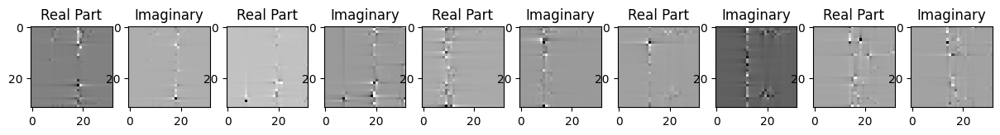

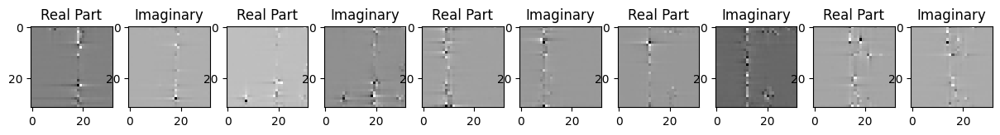

Epoch-181 lr: 0.0009000000000000001
Loss:  4.540043664746918e-05
torch.Size([5, 2, 32, 32])


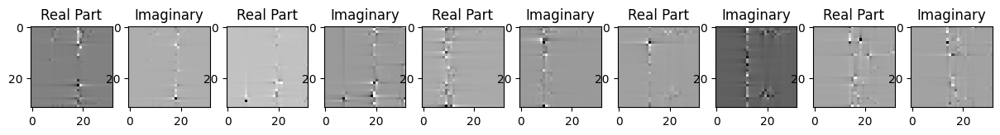

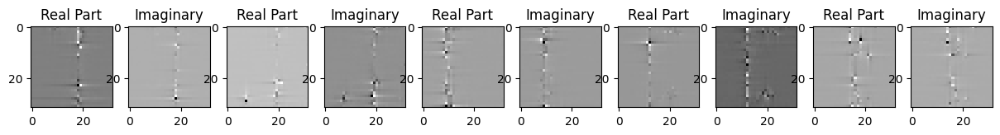

Epoch-182 lr: 0.0009000000000000001
Loss:  7.378390728263184e-05
torch.Size([5, 2, 32, 32])


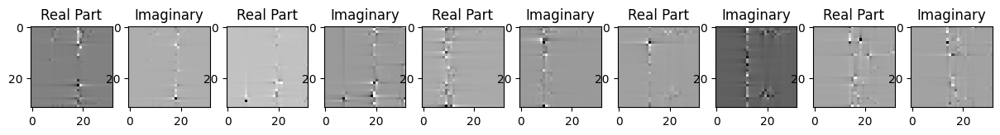

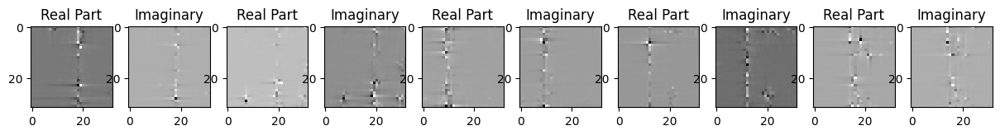

Epoch-183 lr: 0.0009000000000000001


In [ ]:
#epoch=550
with torch.autograd.set_detect_anomaly(True):
  for epoch in range(n_epochs):
      print('Epoch-{0} lr: {1}'.format(epoch+1, optimizer.param_groups[0]['lr']))
      for i in range(total_batches):
          x_batch = x_train[i*batch_size:(i+1)*batch_size,]
          #print(i*batch_size,(i+1)*batch_size)

          # criterion = nn.MSELoss()
          # model.to(device)
          # optimizer = optim.Adam(model.parameters(), lr=0.001, eps=1e-07)
          # scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=100, gamma=0.9)


          model.train()

          out = model(x_batch)

          loss = criterion(out, x_batch)
          train_loss_history.append(loss.item())
          loss.backward()

          optimizer.step()
          optimizer.zero_grad()

      scheduler.step()

      # Validating
      with torch.no_grad():
          model.eval()

          out = model(x_val_1)
          loss = criterion(out, x_val_1)
          print("Loss: ",loss.item())
          val_loss_history.append(loss.item())



      with torch.no_grad():
        input=x_val[0:5,:,:,:]
        print(input.shape)
        model.eval()
        out = model(input)
        CSI_img_ = out.cpu()


        fig, axs = plt.subplots(1, 10, figsize=(15,8))
        for j, l in it.zip_longest(range(0, 5), range(1, 10,2)):
          in_img=input[j,0,:,:].cpu()
          axs[j*2].imshow(np.array(in_img.squeeze(0)), cmap='gist_gray')
          axs[j*2].set_title('Real Part')
          in_img=input[j,1,:,:].cpu()
          axs[l].imshow(np.array(in_img.squeeze(0)), cmap='gist_gray')
          axs[l].set_title('Imaginary')

        fig, axs = plt.subplots(1, 10, figsize=(15,8))
        for i, x in it.zip_longest(range(0, 5), range(1, 10,2)):

          #print(i)
          #CSI_img = random.choice(CSI_img_.cpu())
          img=CSI_img_[i,0,:,:]
          axs[i*2].imshow(np.array(img.squeeze(0)), cmap='gist_gray')
          axs[i*2].set_title('Real Part')
          img=CSI_img_[i,1,:,:]
          axs[x].imshow(np.array(img.squeeze(0)), cmap='gist_gray')
          axs[x].set_title('Imaginary')

        plt.show()


        if epoch%50==0:
          MODEL_PATH = Path("/content/drive/MyDrive/saved_model")
          MODEL_PATH.mkdir(parents=True, # create parent directories if needed
                          exist_ok=True # if models directory already exists, don't error
          )


          # Create model save path
          MODEL_NAME = "_model_{}_{}_{}.pth".format(epoch,envir,encoded_dim)
          MODEL_SAVE_PATH = MODEL_PATH / MODEL_NAME

          # Save the model state dict
          print(f"Saving model to: {MODEL_SAVE_PATH}")
          torch.save({'epoch': epoch,'model_state_dict': model.state_dict(),'optimizer_state_dict': optimizer.state_dict(),
                      'lr_state_dict': scheduler.state_dict()}, # only saving the state_dict() only saves the learned parameters
                      f=MODEL_SAVE_PATH)

      #if epoch%50==0:
      # with torch.no_grad():
      #   model.eval()
      #   x_hat = model(x_test)
      #   x_test = x_test.to(device)
      #   x_hat=x_hat.to(device)
      #   X_test = torch.reshape(X_test, (len(X_test), img_height, 125))
      #   x_test_real = torch.reshape(x_test[:, 0, :, :], (len(x_test), -1))
      #   x_test_imag = torch.reshape(x_test[:, 1, :, :], (len(x_test), -1))
      #   x_test_C = x_test_real - 0.5 + 1j * (x_test_imag - 0.5)
      #   x_hat_real = torch.reshape(x_hat[:, 0, :, :], (len(x_hat), -1))
      #   x_hat_imag = torch.reshape(x_hat[:, 1, :, :], (len(x_hat), -1))
      #   x_hat_C = x_hat_real - 0.5 + 1j * (x_hat_imag - 0.5)
      #   x_hat_F = torch.reshape(x_hat_C, (len(x_hat_C), img_height, img_width))
      #   X_hat = torch.fft.fft(torch.cat((x_hat_F, torch.zeros((len(x_hat_C), img_height, 257 - img_width)).to(device)), axis=2), axis=2)
      #   X_hat = X_hat[:, :, 0:125]

      #   n1 = torch.sqrt(torch.sum(torch.conj(X_test) * X_test, axis=1)).to(device)
      #   n2 = torch.sqrt(torch.sum(torch.conj(X_hat) * X_hat, axis=1)).to(device)
      #   aa = abs(torch.sum(torch.conj(X_test.to(device)) * X_hat, axis=1).to(device)).to(device)
      #   rho = torch.mean(aa / (n1 * n2), axis=1).to(device)
      #   X_hat = torch.reshape(X_hat, (len(X_hat), -1))
      #   X_test = torch.reshape(X_test, (len(X_test), -1))
      #   power = torch.sum(abs(x_test_C) ** 2, axis=1).to(device)
      #   power_d = torch.sum(abs(X_hat) ** 2, axis=1).to(device)
      #   mse = torch.sum(abs(x_test_C - x_hat_C) ** 2, axis=1).to(device)
      #   NMSE = 10 * math.log10(torch.mean(mse / power))
      #   Correlation = torch.mean(rho).item().real

      #   print("In " + envir + " environment")
      #   print("When dimension is", encoded_dim)
      #   print("NMSE is ", NMSE)
      #   print("Correlation is ", Correlation)






tEnd = time.time()
training_time = tEnd - tStart
print("It cost %f sec for training." % training_time)